# Book Recommenmdation System

In a very general way, recommender systems are algorithms aimed at suggesting relevant items to users (items being movies to watch, text to read, products to buy, or anything else depending on industries). Recommender systems are really critical in some industries as they can generate a huge amount of income when they are efficient or also be a way to stand out significantly from competitors. The main objective is to create a book recommendation system for users.

In [1]:
#Importinf Libraries
import pandas as pd
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
# This is to supress the warning messages (if any) generated in our code
import warnings
warnings.filterwarnings('ignore')

# Data

● Users : Contains the users. Note that user IDs (User-ID) have been anonymized and map to integers. Demographic data is provided (Location, Age) if available. Otherwise, these fields contain NULL values. ● Books : Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (Book-Title, Book-Author, Year-Of-Publication, Publisher), obtained from Amazon Web Services. Note that in the case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavors (Image-URL-S, Image-URL-M, Image-URL-L), i.e., small, medium, large. These URLs point to the Amazon website. ● Ratings : Contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

# Importing Dataset

In [2]:
#Users data
users = pd.read_csv(r"Downloads\Users.csv")
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [3]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [4]:
#Book data
books = pd.read_csv("Downloads\Book.csv")
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [5]:
#Rating data
ratings = pd.read_csv("Downloads\Rating.csv")
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,155061224,5
2,276727,446520802,0
3,276729,052165615X,3
4,276729,521795028,6


In [6]:
# Dimension of Dataset

In [7]:
users.shape,ratings.shape,books.shape

((278858, 3), (1048575, 3), (271360, 8))

# 1) Users_dataset

In [8]:
def missing_values(df):
    mis_val=df.isnull().sum()
    mis_val_percent=round(df.isnull().mean().mul(100),2)
    mz_table=pd.concat([mis_val,mis_val_percent],axis=1)
    mz_table=mz_table.rename(
    columns={df.index.name:'col_name',0:'Missing Values',1:'% of Total Values'})
    mz_table['Data_type']=df.dtypes
    mz_table=mz_table.sort_values('% of Total Values',ascending=False)
    return mz_table.reset_index()

In [9]:
missing_values(users)

,index,Missing Values,% of Total Values,Data_type
0,Age,110762,39.72,float64
1,User-ID,0,0.00,int64
2,Location,0,0.00,object


Age have about 39% of missing values.

In [10]:
#Age distribution

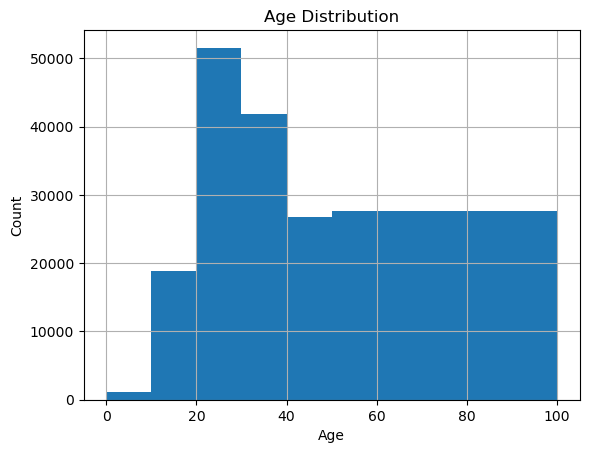

In [11]:
users.Age.hist(bins=[0,10,20,30,40,50,100])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

The most active users are ampong those in their 20-40s of age

Text(0.5, 1.0, 'Find outlier data in Age column')

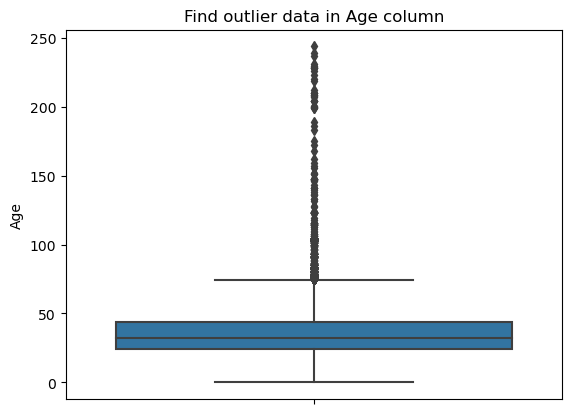

In [12]:
#Outliers detection
sns.boxplot(y = 'Age', data= users)
plt.title('Find outlier data in Age column')

In [13]:
print(sorted(users.Age.unique()))

[nan, 0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 113.0, 114.0, 115.0, 116.0, 118.0, 119.0, 123.0, 124.0, 127.0, 128.0, 132.0, 133.0, 136.0, 137.0, 138.0, 140.0, 141.0, 143.0, 146.0, 147.0, 148.0, 151.0, 152.0, 156.0, 157.0, 159.0, 162.0, 168.0, 172.0, 175.0, 183.0, 186.0, 189.0, 199.0, 200.0, 201.0, 204.0, 207.0, 208.0, 209.0, 210.0, 212.0, 219.0, 220.0, 223.0, 226.0

Ok we have Outlier data in Age

In [14]:
#lets find our unique value in location column

In [15]:
users.Location.unique()

array(['nyc, new york, usa', 'stockton, california, usa',
       'moscow, yukon territory, russia', ...,
       'sergnano, lombardia, italy', 'stranraer, n/a, united kingdom',
       'tacoma, washington, united kingdom'], dtype=object)

In [16]:
users.Location.nunique()

57339

57339 unique values, its really hard to understand so lets create column Country

In [17]:
for i in users :
    users['Country'] = users.Location.str.extract(r'\,+\s?(\w*\s?\w*)\"*$')

In [18]:
users.Country.nunique()

529

In [19]:
#drop location column
users.drop('Location',axis=1,inplace=True)

In [20]:
users

,User-ID,Age,Country
0,1,NaN,usa
1,2,18.0,usa
2,3,NaN,russia
3,4,17.0,portugal
4,5,NaN,united kingdom
...,...,...,...
278853,278854,NaN,usa
278854,278855,50.0,united kingdom
278855,278856,NaN,canada
278856,278857,NaN,usa


In [21]:
users.isnull().sum()

User-ID         0
Age        110762
Country       369
dtype: int64

In [22]:
users['Country'] = users['Country'].astype('str')

In [23]:
a = list(users.Country.unique())
a =set(a)
a= list(a)
a = [x for x in a if x is not None]
a.sort()
print(a)

['', '01776', '02458', '19104', '23232', '30064', '85021', '87510', '_ brasil', 'a', 'aaa', 'adsgfdr', 'afghanistan', 'ahrensburg', 'alachua', 'albania', 'alderney', 'algeria', 'algérie', 'allen', 'ama lurra', 'america', 'american samoa', 'andorra', 'angola', 'antarctica', 'aotearoa', 'argentina', 'armenia', 'aroostook', 'aruba', 'asturies', 'auckland', 'austbritania', 'australia', 'australii', 'austria', 'autralia', 'az', 'azerbaijan', 'bademn würtemberg', 'bahamas', 'bahrain', 'baltimore', 'bangladesh', 'barbados', 'basilicata', 'basque country', 'bavaria', 'baxter', 'bbbzzzzz', 'belarus', 'belgi', 'belgique', 'belgium', 'belize', 'bell', 'benin', 'berguedà', 'bermuda', 'bernalillo', 'bfe', 'bhutan', 'bih', 'bkk', 'bladen', 'bolivia', 'bosnia', 'botswana', 'brasil', 'brazil', 'brunei', 'brunei darussalam', 'bucks', 'bulgaria', 'buncombe', 'burkina faso', 'burkinafasu', 'burlington', 'burma', 'butler', 'c', 'cadd0', 'calabria', 'california', 'cambodia', 'camden', 'cameroon', 'can', 'c

Some data has Misspellings , Lets correct it.

In [24]:
users['Country'].replace(['','01776','02458','19104','23232','30064','85021','87510','alachua','america','austria','autralia','cananda','geermany','italia','united kindgonm','united sates','united staes','united state','united states','us'],
                           ['other','usa','usa','usa','usa','usa','usa','usa','usa','usa','australia','australia','canada','germany','italy','united kingdom','usa','usa','usa','usa','usa'],inplace=True)

Text(0.5, 1.0, 'Count of users Country wise')

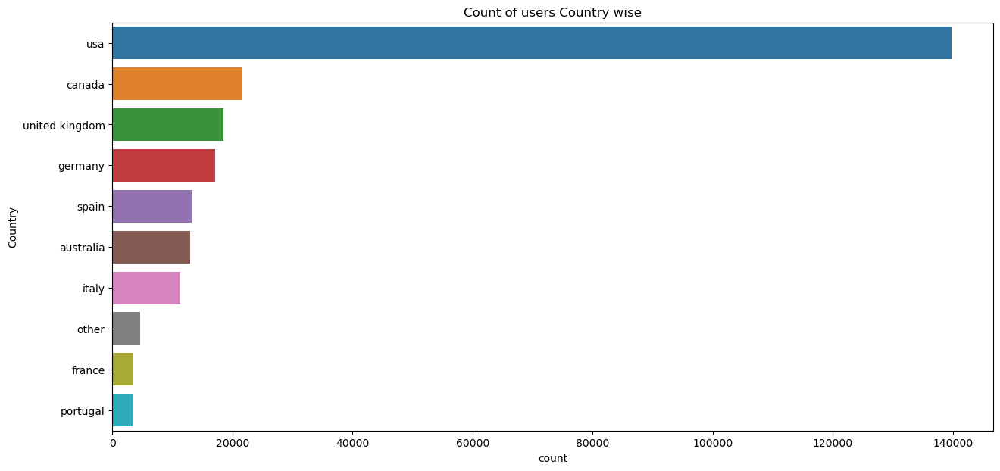

In [25]:
plt.figure(figsize=(15,7))
sns.countplot(y='Country',data=users,order=pd.value_counts(users['Country']).iloc[:10].index)
plt.title('Count of users Country wise')

Most number of users are from USA

In [26]:
#Lets treat outliers in users age

Text(0.5, 1.0, 'Age Distribution Plot')

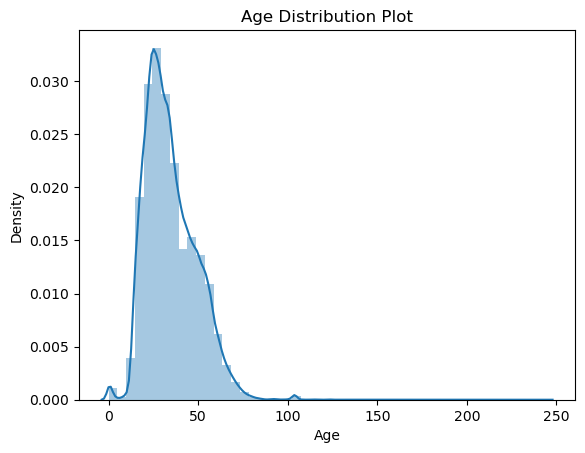

In [27]:
sns.distplot(users.Age)
plt.title('Age Distribution Plot')

Age value's below 5 and above 100 do not make much sense for our book rating case...hence replacing these by NaNs

In [28]:
#Outlier data became NaN
users.loc[(users.Age > 100) | (users.Age < 5), 'Age'] = np.nan

In [29]:
users.isna().sum()

User-ID         0
Age        112010
Country         0
dtype: int64

Age has positive Skewness (right tail) so we can use median to fill Nan values, but for this we don't like to fill Nan value just for one range of age. To handle this we'll use country column to fill Nan.

In [30]:
users['Age'] = users['Age'].fillna(users.groupby('Country')['Age'].transform('median'))

In [31]:
users.isna().sum()

User-ID      0
Age        276
Country      0
dtype: int64

Still we have 276 Nan values let's fill them with mean

In [32]:
users['Age'].fillna(users.Age.mean(), inplace=True)

In [33]:
users.isna().sum()

User-ID    0
Age        0
Country    0
dtype: int64

# 2)Books_Dataset

In [34]:
books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [35]:
books.head(2)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...


In [36]:
#Top 10 Authors which have written the most books.

Text(0.5, 1.0, 'Top 10 Authors')

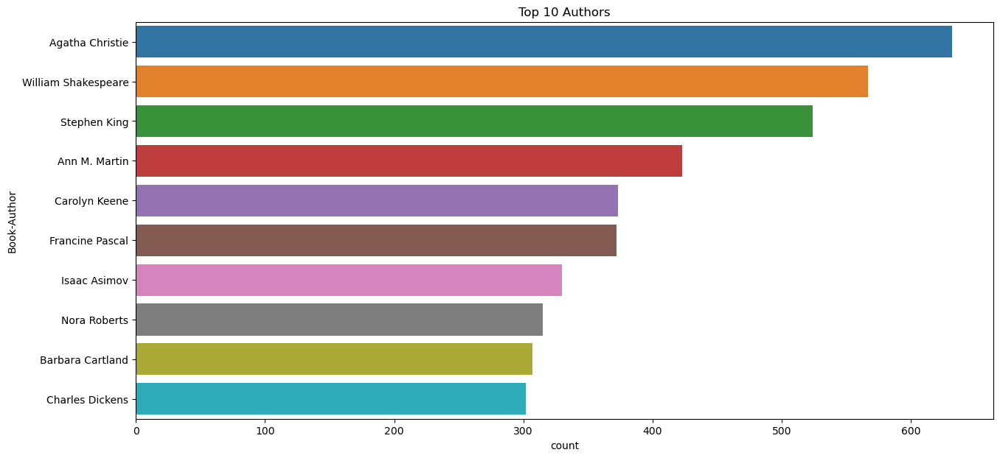

In [37]:
plt.figure(figsize=(15,7))
sns.countplot(y='Book-Author',data=books,order=pd.value_counts(books['Book-Author']).iloc[:10].index)
plt.title('Top 10 Authors')

In [38]:
#Top 10 Publisher which have published the most books

Text(0.5, 1.0, 'Top 10 Publishers')

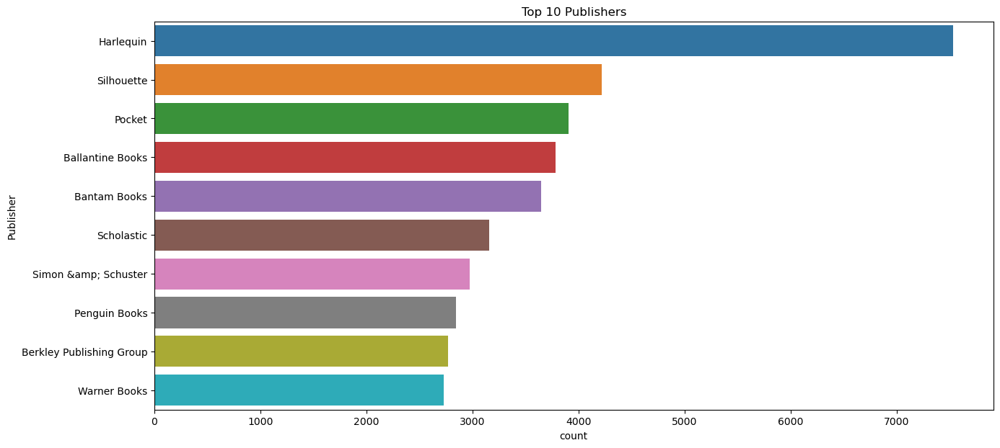

In [39]:
plt.figure(figsize=(15,7))
sns.countplot(y='Publisher',data=books,order=pd.value_counts(books['Publisher']).iloc[:10].index)
plt.title('Top 10 Publishers')

In [40]:
books['Year-Of-Publication']=books['Year-Of-Publication'].astype('str')
a=list(books['Year-Of-Publication'].unique())
a=set(a)
a=list(a)
a = [x for x in a if x is not None]
a.sort()
print(a)

['0', '1376', '1378', '1806', '1897', '1900', '1901', '1902', '1904', '1906', '1908', '1909', '1910', '1911', '1914', '1917', '1919', '1920', '1921', '1922', '1923', '1924', '1925', '1926', '1927', '1928', '1929', '1930', '1931', '1932', '1933', '1934', '1935', '1936', '1937', '1938', '1939', '1940', '1941', '1942', '1943', '1944', '1945', '1946', '1947', '1948', '1949', '1950', '1951', '1952', '1953', '1954', '1955', '1956', '1957', '1958', '1959', '1960', '1961', '1962', '1963', '1964', '1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2008', '2010', '2011', '2012', '2020', '2021', '2024', '2026', '2030', '2037', '2038', '2050', 'DK Publishing Inc', 'Gallimard']


In [41]:
#investigating the rows having 'DK Publishing Inc' as year Of Publication
books.loc[books['Year-Of-Publication'] == 'DK Publishing Inc',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,NaN
221678,789466953,"DK Readers: Creating the X-Men, How Comic Book...",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,http://images.amazon.com/images/P/0789466953.0...,NaN


As it can be seen from above that there are some incorrect entries in Year-Of-Publication field. It looks like Publisher names 'DK Publishing Inc' and 'Gallimard' have been incorrectly loaded as Year-Of-Publication in dataset due to some errors in csv file

In [42]:
#From above, it is seen that bookAuthor is incorrectly loaded with bookTitle, hence making required corrections
#ISBN '0789466953'
books.loc[books.ISBN == '0789466953','Year-Of-Publication'] = 2000
books.loc[books.ISBN == '0789466953','Book-Author'] = "James Buckley"
books.loc[books.ISBN == '0789466953','Publisher'] = "DK Publishing Inc"
books.loc[books.ISBN == '0789466953','Book-Title'] = "DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)"

In [43]:
#ISBN '078946697X'
books.loc[books.ISBN == '078946697X','Year-Of-Publication'] = 2000
books.loc[books.ISBN == '078946697X','Book-Author'] = "Michael Teitelbaum"
books.loc[books.ISBN == '078946697X','Publisher'] = "DK Publishing Inc"
books.loc[books.ISBN == '078946697X','Book-Title'] = "DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)"

In [44]:
#rechecking
books.loc[(books.ISBN == '0789466953') | (books.ISBN == '078946697X'),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Beg...",Michael Teitelbaum,2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.0...,http://images.amazon.com/images/P/078946697X.0...,NaN


In [45]:
#investigating the rows having 'Gallimard' as yearOfPublication
books.loc[books['Year-Of-Publication'] == 'Gallimard',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-M...",2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,NaN


In [46]:
#making required corrections as above, keeping other fields intact
books.loc[books.ISBN == '2070426769','Year-Of-Publication'] = 2003
books.loc[books.ISBN == '2070426769','Book-Author'] = "Jean-Marie Gustave Le ClÃ?Â©zio"
books.loc[books.ISBN == '2070426769','Publisher'] = "Gallimard"
books.loc[books.ISBN == '2070426769','Book-Title'] = "Peuple du ciel, suivi de 'Les Bergers"


books.loc[books.ISBN == '2070426769',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers",Jean-Marie Gustave Le ClÃ?Â©zio,2003,Gallimard,http://images.amazon.com/images/P/2070426769.0...,http://images.amazon.com/images/P/2070426769.0...,NaN


In [47]:
books['Year-Of-Publication']=pd.to_numeric(books['Year-Of-Publication'], errors='coerce')

print(sorted(books['Year-Of-Publication'].unique()))
#Now it can be seen that yearOfPublication has all values as integers

[0.0, 1376.0, 1378.0, 1806.0, 1897.0, 1900.0, 1901.0, 1902.0, 1904.0, 1906.0, 1908.0, 1909.0, 1910.0, 1911.0, 1914.0, 1917.0, 1919.0, 1920.0, 1921.0, 1922.0, 1923.0, 1924.0, 1925.0, 1926.0, 1927.0, 1928.0, 1929.0, 1930.0, 1931.0, 1932.0, 1933.0, 1934.0, 1935.0, 1936.0, 1937.0, 1938.0, 1939.0, 1940.0, 1941.0, 1942.0, 1943.0, 1944.0, 1945.0, 1946.0, 1947.0, 1948.0, 1949.0, 1950.0, 1951.0, 1952.0, 1953.0, 1954.0, 1955.0, 1956.0, 1957.0, 1958.0, 1959.0, 1960.0, 1961.0, 1962.0, 1963.0, 1964.0, 1965.0, 1966.0, 1967.0, 1968.0, 1969.0, 1970.0, 1971.0, 1972.0, 1973.0, 1974.0, 1975.0, 1976.0, 1977.0, 1978.0, 1979.0, 1980.0, 1981.0, 1982.0, 1983.0, 1984.0, 1985.0, 1986.0, 1987.0, 1988.0, 1989.0, 1990.0, 1991.0, 1992.0, 1993.0, 1994.0, 1995.0, 1996.0, 1997.0, 1998.0, 1999.0, 2000.0, 2001.0, 2002.0, 2003.0, 2004.0, 2005.0, 2006.0, 2008.0, 2010.0, 2011.0, 2012.0, 2020.0, 2021.0, 2024.0, 2026.0, 2030.0, 2037.0, 2038.0, 2050.0, nan]


The value 0 for Year-Of_Publication is invalid and as this dataset was published in 2004, We have assumed that the years after 2006 to be invalid and setting invalid years as NaN

Reference of the fact: http://www2.informatik.uni-freiburg.de/~cziegler/BX/

In [48]:
books.loc[(books['Year-Of-Publication'] > 2006) | (books['Year-Of-Publication'] == 0),'Year-Of-Publication'] = np.NAN

#replacing NaNs with median value of Year-Of-Publication
books['Year-Of-Publication'].fillna(round(books['Year-Of-Publication'].median()), inplace=True)

In [49]:
#dropping last three columns containing image URLs which will not be required for analysis
books.drop(['Image-URL-S', 'Image-URL-M', 'Image-URL-L'],axis=1,inplace=True)

In [50]:
books.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
dtype: int64

In [51]:
#exploring 'publisher' column
books.loc[books.Publisher.isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002.0,NaN
129037,1931696993,Finders Keepers,Linnea Sinclair,2001.0,NaN


In [52]:
#Filling Nan of Publisher with others
books.Publisher.fillna('other',inplace=True)

In [53]:
#exploring 'Book-Author' column
books.loc[books['Book-Author'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
187689,9627982032,The Credit Suisse Guide to Managing Your Perso...,NaN,1995.0,Edinburgh Financial Publishing


In [54]:
#Filling Nan of Book-Author with others
books['Book-Author'].fillna('other',inplace=True)

In [55]:
books.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

# 3) Ratings Dataset

In [56]:
ratings

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,155061224,5
2,276727,446520802,0
3,276729,052165615X,3
4,276729,521795028,6
...,...,...,...
1048570,250764,451410777,0
1048571,250764,452264464,8
1048572,250764,048623715X,0
1048573,250764,486256588,0


Ratings dataset should have books only which exist in our books dataset

In [57]:
ratings_new = ratings[ratings.ISBN.isin(books.ISBN)]
ratings.shape, ratings_new.shape

((1048575, 3), (941112, 3))

It can be seen that many rows having book ISBN not part of books dataset got dropped off

Ratings dataset should have ratings from users which exist in users dataset.

In [58]:
print("Shape of dataset before dropping",ratings_new.shape)
ratings_new = ratings_new[ratings_new['User-ID'].isin(users['User-ID'])]
print("shape of dataset after dropping",ratings_new.shape)

Shape of dataset before dropping (941112, 3)
shape of dataset after dropping (941112, 3)


It can be seen that no new user was there in ratings dataset.

Let's see how the ratings are distributed

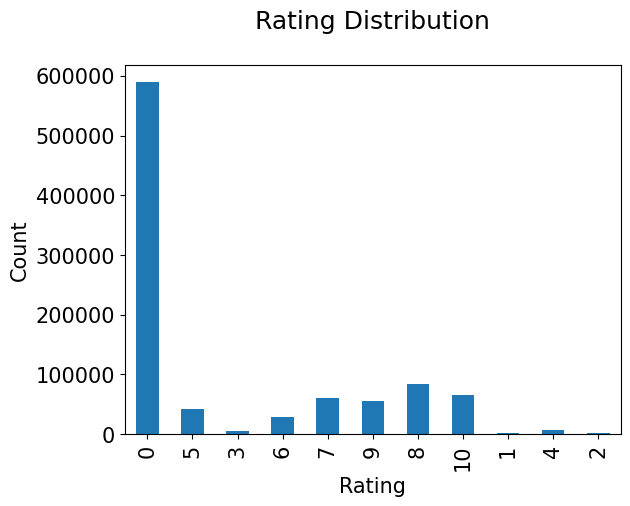

In [59]:
plt.rc("font", size=15)
ratings_new['Book-Rating'].value_counts(sort=False).plot(kind='bar')
plt.title('Rating Distribution\n')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.show()

The ratings are very unevenly distributed, and the vast majority of ratings are 0 .As quoted in the description of the dataset - BX-Book-Ratings contains the book rating information. Ratings are either explicit, expressed on a scale from 1-10 higher values denoting higher appreciation, or implicit, expressed by 0.Hence segragating implicit and explict ratings datasets

In [60]:
#Hence segragating implicit and explict ratings datasets
ratings_explicit = ratings_new[ratings_new['Book-Rating'] != 0]
ratings_implicit = ratings_new[ratings_new['Book-Rating'] == 0]

In [61]:
print('ratings_explicit dataset',ratings_explicit.shape)
print('ratings_implicit dataset',ratings_implicit.shape)

ratings_explicit dataset (351857, 3)
ratings_implicit dataset (589255, 3)


<Axes: xlabel='Book-Rating', ylabel='count'>

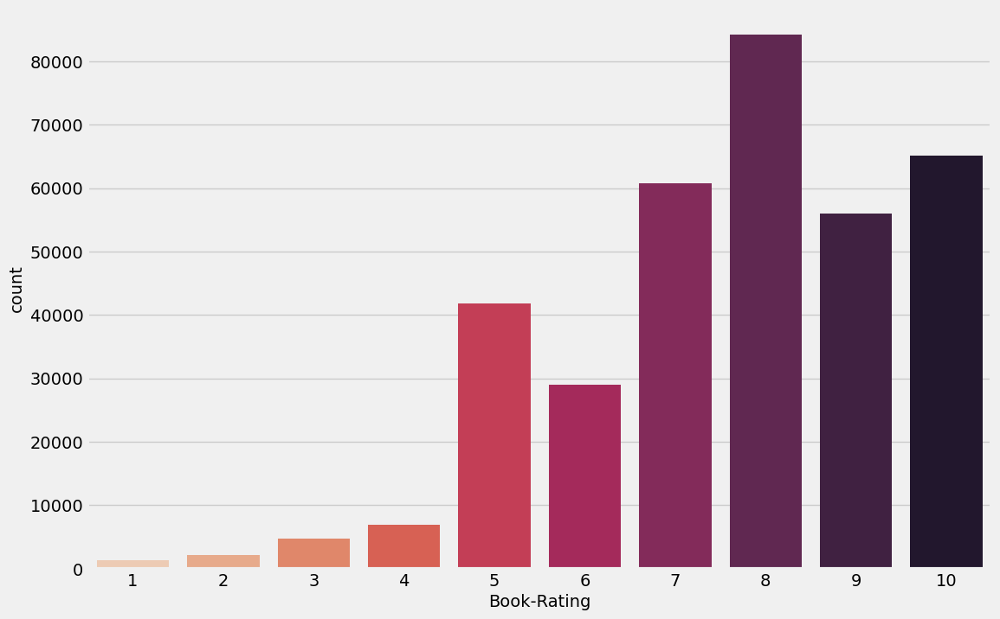

In [62]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(12, 8))
sns.countplot(data=ratings_explicit , x='Book-Rating', palette='rocket_r')

It can be observe that higher ratings are more common amongst users and rating 8 has been rated highest number of times

In [63]:
#Let's find the top 5 books which are rated by most number of users.
rating_count = pd.DataFrame(ratings_explicit.groupby('ISBN')['Book-Rating'].count())
rating_count.sort_values('Book-Rating', ascending=False).head()

,Book-Rating
ISBN,
316666343,635
971880107,526
385504209,452
312195516,354
60928336,292


The book with ISBN '0316666343' received the most rating counts.

In [64]:
#Let’s find out what book it is, and what books are in the top 5.
most_rated_books = pd.DataFrame(['0316666343', '0971880107', '0385504209', '0312195516', '0060928336'], index=np.arange(5), columns = ['ISBN'])
most_rated_books_summary = pd.merge(most_rated_books, books, on='ISBN')
most_rated_books_summary

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher


The book that received the most rating counts in this data set is Rich Shapero’s “Wild Animus”. And there is something in common among these five books that received the most rating counts — they are all novels. So it is conclusive that novels are popular and likely receive more ratings.

In [65]:
#create column Rating Average
ratings_explicit ['Avg_Rating'] = ratings_explicit.groupby('ISBN')['Book-Rating'].transform('mean')

In [66]:
#Cearting column Rating sum
ratings_explicit['Total_No_Of_Users_Rated']=ratings_explicit.groupby('ISBN')['Book-Rating'].transform('count')

In [67]:
ratings_explicit

,User-ID,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated
1,276726,155061224,5,5.000000,1
3,276729,052165615X,3,3.000000,1
4,276729,521795028,6,6.000000,1
8,276744,038550120X,7,7.541667,72
16,276747,60517794,9,7.964286,28
...,...,...,...,...,...
1048430,250764,380486601,5,6.000000,2
1048446,250764,380778556,10,7.897436,39
1048494,250764,439098645,8,8.833333,6
1048509,250764,440212723,9,8.250000,16


# Merging All Dataset

In [68]:
Final_Dataset=users.copy()
Final_Dataset=pd.merge(Final_Dataset,ratings_explicit,on='User-ID')
Final_Dataset=pd.merge(Final_Dataset,books,on='ISBN')

In [69]:
Final_Dataset

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,33.0,canada,2005018,5,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
1,11676,28.0,nan,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
2,67544,30.0,canada,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
4,123629,33.0,canada,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
...,...,...,...,...,...,...,...,...,...,...,...
351852,278851,33.0,usa,767907566,5,5.000,1,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books
351853,278851,33.0,usa,789721260,5,5.000,1,WebClasses From Scratch,Jesse Liberty,1999.0,Que
351854,278851,33.0,usa,884159221,7,7.000,1,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books
351855,278851,33.0,usa,912333022,7,7.000,1,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books


In [70]:
missing_values(Final_Dataset)

,index,Missing Values,% of Total Values,Data_type
0,User-ID,0,0.0,int64
1,Age,0,0.0,float64
2,Country,0,0.0,object
3,ISBN,0,0.0,object
4,Book-Rating,0,0.0,int64
5,Avg_Rating,0,0.0,float64
6,Total_No_Of_Users_Rated,0,0.0,int64
7,Book-Title,0,0.0,object
8,Book-Author,0,0.0,object
9,Year-Of-Publication,0,0.0,float64


In [71]:
Final_Dataset.shape

(351857, 11)

In [72]:
Final_Dataset

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,33.0,canada,2005018,5,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
1,11676,28.0,nan,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
2,67544,30.0,canada,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
4,123629,33.0,canada,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
...,...,...,...,...,...,...,...,...,...,...,...
351852,278851,33.0,usa,767907566,5,5.000,1,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books
351853,278851,33.0,usa,789721260,5,5.000,1,WebClasses From Scratch,Jesse Liberty,1999.0,Que
351854,278851,33.0,usa,884159221,7,7.000,1,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books
351855,278851,33.0,usa,912333022,7,7.000,1,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books


# Collaborative Filtering based Recommendation System

In [73]:
Final_Dataset

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,8,33.0,canada,2005018,5,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
1,11676,28.0,nan,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
2,67544,30.0,canada,2005018,8,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
4,123629,33.0,canada,2005018,9,7.875,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
...,...,...,...,...,...,...,...,...,...,...,...
351852,278851,33.0,usa,767907566,5,5.000,1,All Elevations Unknown: An Adventure in the He...,Sam Lightner,2001.0,Broadway Books
351853,278851,33.0,usa,789721260,5,5.000,1,WebClasses From Scratch,Jesse Liberty,1999.0,Que
351854,278851,33.0,usa,884159221,7,7.000,1,Why stop?: A guide to Texas historical roadsid...,Claude Dooley,1985.0,Lone Star Books
351855,278851,33.0,usa,912333022,7,7.000,1,The Are You Being Served? Stories: 'Camping In...,Jeremy Lloyd,1997.0,Kqed Books


In [74]:
x = Final_Dataset.groupby('User-ID').count()['Book-Rating'] >50
y = x[x].index

In [75]:
x

User-ID
8         False
9         False
12        False
14        False
16        False
          ...  
278846    False
278849    False
278851    False
278852    False
278854    False
Name: Book-Rating, Length: 61877, dtype: bool

In [76]:
y

Int64Index([   254,    638,   1424,   1733,   1903,   2033,   2110,   2276,
              2766,   2891,
            ...
            249894, 249953, 249958, 250300, 250405, 250709, 277427, 278137,
            278188, 278418],
           dtype='int64', name='User-ID', length=1048)

In [77]:
filtered_rating = Final_Dataset[Final_Dataset['User-ID'].isin(y)]

In [78]:
filtered_rating

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
1,11676,28.0,nan,2005018,8,7.875000,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
3,116866,32.0,other,2005018,9,7.875000,8,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada
18,6242,33.0,canada,452264464,5,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
21,11676,28.0,nan,452264464,8,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
26,22625,54.0,usa,452264464,9,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
351785,278418,36.0,usa,821726595,6,6.000000,1,Mistress of Falcon Court,Charlotte Lammert,1989.0,Kensington Pub Corp (Mm)
351786,278418,36.0,usa,865926433,5,5.000000,1,Yogi Bear and the Uojpbtcutpakic: Story,Horace J. Elias,1981.0,Granite Impex Ltd
351787,278418,36.0,usa,155882068X,5,5.000000,1,The Balloon Man (Crime Classics),Charlotte Armstrong,1990.0,Independent Pub Group
351788,278418,36.0,usa,1569751544,3,3.000000,1,The Sleep Solution: A 21-Night Program to Bett...,Nigel Ball,1998.0,Ulysses Press


In [79]:
y1 = filtered_rating.groupby('Book-Title').count()['Book-Rating']>= 10
famous_books = y1[y1].index

In [80]:
famous_books

Index(['1984', '1st to Die: A Novel', '2010: Odyssey Two', '2nd Chance',
       '3rd Degree', '4 Blondes', '84 Charing Cross Road',
       'A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))',
       'A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash',
       'A Bend in the Road',
       ...
       'Wuthering Heights', 'Wuthering Heights (Penguin Classics)',
       'Xanth 14: Question Quest', 'Xanth 15: The Color of Her Panties',
       'YOU BELONG TO ME', 'Year of Wonders', 'You Belong To Me', 'Yukon Ho!',
       'Zen and the Art of Motorcycle Maintenance: An Inquiry into Values',
       '\O\" Is for Outlaw"'],
      dtype='object', name='Book-Title', length=1484)

In [81]:
final_ratings = filtered_rating[filtered_rating['Book-Title'].isin(famous_books) ]
final_ratings

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
18,6242,33.0,canada,452264464,5,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
21,11676,28.0,nan,452264464,8,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
26,22625,54.0,usa,452264464,9,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
30,36907,39.0,canada,452264464,10,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
35,58363,81.0,usa,452264464,5,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
349854,248496,33.0,canada,039914014X,9,9.000000,1,Home Song,Lavyrle Spencer,1995.0,Putnam Pub Group
349983,248718,43.0,usa,031202164X,8,8.000000,1,Ashes to Ashes,Mary Monica Pulver,1988.0,Horizon Book Promotions
350996,249958,12.0,usa,754078124,10,10.000000,1,The Bad Beginning (A Series of Unfortunate Eve...,Lemony Snicket,2002.0,Chivers Large Print
351073,250300,22.0,singapore,553480650,7,7.000000,1,Anne of Windy Poplars (Anne of Green Gables No...,L. M. Montgomery,1992.0,Bantam Books


In [82]:
final_ratings['User-ID'].nunique()

1027

# Item- Item Based Filtering

In [83]:
pt = final_ratings.pivot_table(index='Book-Title',columns='User-ID',values='Book-Rating')

In [84]:
pt

User-ID,254,638,1424,1733,1903,2033,2110,2276,2766,2891,...,249894,249953,249958,250300,250405,250709,277427,278137,278188,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1st to Die: A Novel,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2010: Odyssey Two,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2nd Chance,NaN,9.0,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3rd Degree,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Year of Wonders,NaN,NaN,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
You Belong To Me,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Yukon Ho!,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [85]:
pt.fillna(0,inplace=True)

In [86]:
pt

User-ID,254,638,1424,1733,1903,2033,2110,2276,2766,2891,...,249894,249953,249958,250300,250405,250709,277427,278137,278188,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010: Odyssey Two,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,9.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3rd Degree,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Year of Wonders,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
You Belong To Me,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Yukon Ho!,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [87]:
#Calculate the distances and similarity

In [88]:
from sklearn.metrics import pairwise_distances

In [89]:
pd.DataFrame(pairwise_distances(pt, metric='cosine'))

,0,1,2,3,4,5,6,7,8,9,...,1474,1475,1476,1477,1478,1479,1480,1481,1482,1483
0,0.000000,0.917155,0.916750,0.976727,0.973286,1.000000,0.897518,0.965793,1.000000,0.944884,...,0.916236,1.000000,0.934650,0.936088,0.929042,9.212391e-01,0.962898,0.934520,0.898992,0.946537
1,0.917155,0.000000,0.979188,0.751567,0.823233,1.000000,0.972699,0.946552,1.000000,0.920932,...,0.914965,1.000000,1.000000,0.960234,0.871480,9.506719e-01,0.857161,0.934589,0.949012,0.879911
2,0.916750,0.979188,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.932104,1.000000,1.000000,1.000000,1.000000,9.619899e-01,1.000000,1.000000,0.910944,1.000000
3,0.976727,0.751567,1.000000,0.000000,0.748828,1.000000,0.975117,0.900623,1.000000,0.895020,...,0.966784,1.000000,1.000000,1.000000,0.792889,9.492226e-01,0.878688,0.964752,0.969096,0.903974
4,0.973286,0.823233,1.000000,0.748828,0.000000,1.000000,0.971438,1.000000,1.000000,0.906720,...,0.961873,1.000000,1.000000,1.000000,0.941541,1.000000e+00,0.969433,0.959540,0.971995,0.976991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1479,0.921239,0.950672,0.961990,0.949223,1.000000,0.893413,1.000000,1.000000,1.000000,1.000000,...,0.952669,1.000000,1.000000,1.000000,0.942851,2.220446e-16,1.000000,0.930241,1.000000,1.000000
1480,0.962898,0.857161,1.000000,0.878688,0.969433,0.926048,0.960331,1.000000,1.000000,0.922594,...,0.947047,1.000000,0.861527,0.864576,0.918809,1.000000e+00,0.000000,0.943807,0.961104,0.830328
1481,0.934520,0.934589,1.000000,0.964752,0.959540,1.000000,0.947492,1.000000,1.000000,0.957938,...,0.891748,1.000000,1.000000,1.000000,0.854319,9.302410e-01,0.943807,0.000000,0.948516,0.957701
1482,0.898992,0.949012,0.910944,0.969096,0.971995,1.000000,0.963655,1.000000,1.000000,0.970886,...,0.951484,0.946064,0.923878,1.000000,0.925612,1.000000e+00,0.961104,0.948516,0.000000,0.970721


In [90]:
sim = 1- pairwise_distances(pt, metric='cosine')
pd.DataFrame(sim)

,0,1,2,3,4,5,6,7,8,9,...,1474,1475,1476,1477,1478,1479,1480,1481,1482,1483
0,1.000000,0.082845,0.083250,0.023273,0.026714,0.000000,0.102482,0.034207,0.000000,0.055116,...,0.083764,0.000000,0.065350,0.063912,0.070958,0.078761,0.037102,0.065480,0.101008,0.053463
1,0.082845,1.000000,0.020812,0.248433,0.176767,0.000000,0.027301,0.053448,0.000000,0.079068,...,0.085035,0.000000,0.000000,0.039766,0.128520,0.049328,0.142839,0.065411,0.050988,0.120089
2,0.083250,0.020812,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.067896,0.000000,0.000000,0.000000,0.000000,0.038010,0.000000,0.000000,0.089056,0.000000
3,0.023273,0.248433,0.000000,1.000000,0.251172,0.000000,0.024883,0.099377,0.000000,0.104980,...,0.033216,0.000000,0.000000,0.000000,0.207111,0.050777,0.121312,0.035248,0.030904,0.096026
4,0.026714,0.176767,0.000000,0.251172,1.000000,0.000000,0.028562,0.000000,0.000000,0.093280,...,0.038127,0.000000,0.000000,0.000000,0.058459,0.000000,0.030567,0.040460,0.028005,0.023009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1479,0.078761,0.049328,0.038010,0.050777,0.000000,0.106587,0.000000,0.000000,0.000000,0.000000,...,0.047331,0.000000,0.000000,0.000000,0.057149,1.000000,0.000000,0.069759,0.000000,0.000000
1480,0.037102,0.142839,0.000000,0.121312,0.030567,0.073952,0.039669,0.000000,0.000000,0.077406,...,0.052953,0.000000,0.138473,0.135424,0.081191,0.000000,1.000000,0.056193,0.038896,0.169672
1481,0.065480,0.065411,0.000000,0.035248,0.040460,0.000000,0.052508,0.000000,0.000000,0.042062,...,0.108252,0.000000,0.000000,0.000000,0.145681,0.069759,0.056193,1.000000,0.051484,0.042299
1482,0.101008,0.050988,0.089056,0.030904,0.028005,0.000000,0.036345,0.000000,0.000000,0.029114,...,0.048516,0.053936,0.076122,0.000000,0.074388,0.000000,0.038896,0.051484,1.000000,0.029279


In [91]:
np.fill_diagonal(sim,0)

In [92]:
similarity_item = pd.DataFrame(sim)
similarity_item

,0,1,2,3,4,5,6,7,8,9,...,1474,1475,1476,1477,1478,1479,1480,1481,1482,1483
0,0.000000,0.082845,0.083250,0.023273,0.026714,0.000000,0.102482,0.034207,0.000000,0.055116,...,0.083764,0.000000,0.065350,0.063912,0.070958,0.078761,0.037102,0.065480,0.101008,0.053463
1,0.082845,0.000000,0.020812,0.248433,0.176767,0.000000,0.027301,0.053448,0.000000,0.079068,...,0.085035,0.000000,0.000000,0.039766,0.128520,0.049328,0.142839,0.065411,0.050988,0.120089
2,0.083250,0.020812,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.067896,0.000000,0.000000,0.000000,0.000000,0.038010,0.000000,0.000000,0.089056,0.000000
3,0.023273,0.248433,0.000000,0.000000,0.251172,0.000000,0.024883,0.099377,0.000000,0.104980,...,0.033216,0.000000,0.000000,0.000000,0.207111,0.050777,0.121312,0.035248,0.030904,0.096026
4,0.026714,0.176767,0.000000,0.251172,0.000000,0.000000,0.028562,0.000000,0.000000,0.093280,...,0.038127,0.000000,0.000000,0.000000,0.058459,0.000000,0.030567,0.040460,0.028005,0.023009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1479,0.078761,0.049328,0.038010,0.050777,0.000000,0.106587,0.000000,0.000000,0.000000,0.000000,...,0.047331,0.000000,0.000000,0.000000,0.057149,0.000000,0.000000,0.069759,0.000000,0.000000
1480,0.037102,0.142839,0.000000,0.121312,0.030567,0.073952,0.039669,0.000000,0.000000,0.077406,...,0.052953,0.000000,0.138473,0.135424,0.081191,0.000000,0.000000,0.056193,0.038896,0.169672
1481,0.065480,0.065411,0.000000,0.035248,0.040460,0.000000,0.052508,0.000000,0.000000,0.042062,...,0.108252,0.000000,0.000000,0.000000,0.145681,0.069759,0.056193,0.000000,0.051484,0.042299
1482,0.101008,0.050988,0.089056,0.030904,0.028005,0.000000,0.036345,0.000000,0.000000,0.029114,...,0.048516,0.053936,0.076122,0.000000,0.074388,0.000000,0.038896,0.051484,0.000000,0.029279


In [93]:
similarity_item.index = final_ratings['Book-Title'].unique()
similarity_item.columns = final_ratings['Book-Title'].unique()

In [94]:
pd.set_option('display.max_columns', None)

In [95]:
similarity_item

Beloved (Plume Contemporary Fiction)  \
Beloved (Plume Contemporary Fiction)                                            0.000000   
Airframe                                                                        0.082845   
Piercing the Darkness                                                           0.083250   
To Kill a Mockingbird                                                           0.023273   
Seabiscuit: An American Legend                                                  0.026714   
...                                                                                  ...   
Glory in Death                                                                  0.078761   
The Hunt for Red October (Jack Ryan Novels)                                     0.037102   
Rilla of Ingleside (Anne of Green Gables Novels...                              0.065480   
Well-Schooled in Murder                                                         0.101008   
Killing Mr. Griffin (Laurel Leaf Books)                                         0.053463   

                                                    Airframe  \
Beloved (Plume Contemporary Fiction)                0.082845   
Airframe                                            0.000000   
Piercing the Darkness                               0.020812   
To Kill a Mockingbird                               0.248433   
Seabiscuit: An American Legend                      0.176767   
...                                                      ...   
Glory in Death                                      0.049328   
The Hunt for Red October (Jack Ryan Novels)         0.142839   
Rilla of Ingleside (Anne of Green Gables Novels...  0.065411   
Well-Schooled in Murder                             0.050988   
Killing Mr. Griffin (Laurel Leaf Books)             0.120089   

                                                    Piercing the Darkness  \
Beloved (Plume Contemporary Fiction)                             0.083250   
Airframe                                                         0.020812   
Piercing the Darkness                                            0.000000   
To Kill a Mockingbird                                            0.000000   
Seabiscuit: An American Legend                                   0.000000   
...                                                                   ...   
Glory in Death                                                   0.038010   
The Hunt for Red October (Jack Ryan Novels)                      0.000000   
Rilla of Ingleside (Anne of Green Gables Novels...               0.000000   
Well-Schooled in Murder                                          0.089056   
Killing Mr. Griffin (Laurel Leaf Books)                          0.000000   

                                                    To Kill a Mockingbird  \
Beloved (Plume Contemporary Fiction)                             0.023273   
Airframe                                                         0.248433   
Piercing the Darkness                                            0.000000   
To Kill a Mockingbird                                            0.000000   
Seabiscuit: An American Legend                                   0.251172   
...                                                                   ...   
Glory in Death                                                   0.050777   
The Hunt for Red October (Jack Ryan Novels)                      0.121312   
Rilla of Ingleside (Anne of Green Gables Novels...               0.035248   
Well-Schooled in Murder                                          0.030904   
Killing Mr. Griffin (Laurel Leaf Books)                          0.096026   

                                                    Seabiscuit: An American Legend  \
Beloved (Plume Contemporary Fiction)                                      0.026714   
Airframe                                                                  0.176767   
Piercing the Darkness                                                 

In [96]:
#Find out similar users

In [97]:
similarity_item.idxmax()

Beloved (Plume Contemporary Fiction)                                                                       Echoes
Airframe                                                                               The Nanny Diaries: A Novel
Piercing the Darkness                                                                                  Dead Sleep
To Kill a Mockingbird                                                                                 Rainbow Six
Seabiscuit: An American Legend                                                              Nothing Lasts Forever
                                                                                      ...                        
Glory in Death                                                                                            Thinner
The Hunt for Red October (Jack Ryan Novels)                                                              Coraline
Rilla of Ingleside (Anne of Green Gables Novels (Paperback))    Anne of Ingleside (Anne 

In [98]:
from sklearn.metrics.pairwise import cosine_similarity

In [99]:
similarity_item_scores=cosine_similarity(pt)

In [100]:
similarity_item_scores[0]

array([1.        , 0.08284522, 0.08325037, ..., 0.06548022, 0.10100777,
       0.05346285])

In [101]:
similarity_item_scores.shape

(1484, 1484)

In [102]:
def recommend_for_item(book_name):
    index=np.where(pt.index==book_name)[0][0]
    distances=similarity_item_scores[index]
    similar_items=sorted(list(enumerate(similarity_item_scores[index])),key=lambda x:x[1], reverse=True)[1:11]
    data=[]
    for i in similar_items:
        item=[]
        temp_df = books[books['Book-Title'] == pt.index[i[0]]]
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Title'].values))
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Author'].values))

        data.append(item)
    return data

In [103]:
recommend_for_item('The Notebook')

[['The Rescue', 'Nicholas Sparks'],
 ['Nights in Rodanthe', 'Nicholas Sparks'],
 ['The Five People You Meet in Heaven', 'Mitch Albom'],
 ['A Walk to Remember', 'Nicholas Sparks'],
 ['Book Club', 'Mary Alice Monroe'],
 ['Message in a Bottle', 'Nicholas Sparks'],
 ["Suzanne's Diary for Nicholas", 'James Patterson'],
 ['While I Was Gone', 'Sue Miller'],
 ['The Wedding', 'Nicholas Sparks'],
 ['Accident', 'Danielle Steel']]

# User-User Based Filtering

In [104]:
final_ratings

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
18,6242,33.0,canada,452264464,5,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
21,11676,28.0,nan,452264464,8,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
26,22625,54.0,usa,452264464,9,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
30,36907,39.0,canada,452264464,10,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
35,58363,81.0,usa,452264464,5,7.642857,70,Beloved (Plume Contemporary Fiction),Toni Morrison,1994.0,Plume
...,...,...,...,...,...,...,...,...,...,...,...
349854,248496,33.0,canada,039914014X,9,9.000000,1,Home Song,Lavyrle Spencer,1995.0,Putnam Pub Group
349983,248718,43.0,usa,031202164X,8,8.000000,1,Ashes to Ashes,Mary Monica Pulver,1988.0,Horizon Book Promotions
350996,249958,12.0,usa,754078124,10,10.000000,1,The Bad Beginning (A Series of Unfortunate Eve...,Lemony Snicket,2002.0,Chivers Large Print
351073,250300,22.0,singapore,553480650,7,7.000000,1,Anne of Windy Poplars (Anne of Green Gables No...,L. M. Montgomery,1992.0,Bantam Books


In [105]:
pt2 = final_ratings.pivot_table(index='User-ID',columns='Book-Title',values='Book-Rating')

In [106]:
pt2

Book-Title  1984  1st to Die: A Novel  2010: Odyssey Two  2nd Chance  \
User-ID                                                                
254          9.0                  NaN                NaN         NaN   
638          NaN                  NaN                NaN         9.0   
1424         NaN                  NaN                NaN         NaN   
1733         NaN                  NaN                NaN         NaN   
1903         NaN                  NaN                NaN         NaN   
...          ...                  ...                ...         ...   
250709       NaN                  NaN                NaN         NaN   
277427       NaN                  NaN                NaN         NaN   
278137       NaN                  NaN                NaN         NaN   
278188       NaN                  NaN                NaN         NaN   
278418       NaN                  NaN                NaN         NaN   

Book-Title  3rd Degree  4 Blondes  84 Charing Cross Road  \
User-ID                                                    
254                NaN        NaN                    NaN   
638                NaN        NaN                    NaN   
1424               NaN        NaN                    NaN   
1733               NaN        NaN                    NaN   
1903               NaN        NaN                    NaN   
...                ...        ...                    ...   
250709             NaN        NaN                    NaN   
277427             NaN        NaN                    NaN   
278137             NaN        NaN                    NaN   
278188             NaN        NaN                    NaN   
278418             NaN        NaN                    NaN   

Book-Title  A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))  \
User-ID                                                                                             
254                                                       NaN                                       
638                                                       NaN                                       
1424                                                      NaN                                       
1733                                                      NaN                                       
1903                                                      NaN                                       
...                                                       ...                                       
250709                                                    NaN                                       
277427                                                    NaN                                       
278137                                                    NaN                                       
278188                                                    NaN                                       
278418                                                    NaN                                       

Book-Title  A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash  \
User-ID                                                                                      
254                                                       NaN                                
638                                                       NaN                                
1424                                                      NaN                                
1733                                                      NaN                                
1903                                                      NaN                                
...                                                       ...                                
250709                                                    NaN                                
277427                                                    NaN                                
278137                      

In [107]:
pt2.fillna(0,inplace=True)

In [108]:
pt2

Book-Title  1984  1st to Die: A Novel  2010: Odyssey Two  2nd Chance  \
User-ID                                                                
254          9.0                  0.0                0.0         0.0   
638          0.0                  0.0                0.0         9.0   
1424         0.0                  0.0                0.0         0.0   
1733         0.0                  0.0                0.0         0.0   
1903         0.0                  0.0                0.0         0.0   
...          ...                  ...                ...         ...   
250709       0.0                  0.0                0.0         0.0   
277427       0.0                  0.0                0.0         0.0   
278137       0.0                  0.0                0.0         0.0   
278188       0.0                  0.0                0.0         0.0   
278418       0.0                  0.0                0.0         0.0   

Book-Title  3rd Degree  4 Blondes  84 Charing Cross Road  \
User-ID                                                    
254                0.0        0.0                    0.0   
638                0.0        0.0                    0.0   
1424               0.0        0.0                    0.0   
1733               0.0        0.0                    0.0   
1903               0.0        0.0                    0.0   
...                ...        ...                    ...   
250709             0.0        0.0                    0.0   
277427             0.0        0.0                    0.0   
278137             0.0        0.0                    0.0   
278188             0.0        0.0                    0.0   
278418             0.0        0.0                    0.0   

Book-Title  A 2nd Helping of Chicken Soup for the Soul (Chicken Soup for the Soul Series (Paper))  \
User-ID                                                                                             
254                                                       0.0                                       
638                                                       0.0                                       
1424                                                      0.0                                       
1733                                                      0.0                                       
1903                                                      0.0                                       
...                                                       ...                                       
250709                                                    0.0                                       
277427                                                    0.0                                       
278137                                                    0.0                                       
278188                                                    0.0                                       
278418                                                    0.0                                       

Book-Title  A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash  \
User-ID                                                                                      
254                                                       0.0                                
638                                                       0.0                                
1424                                                      0.0                                
1733                                                      0.0                                
1903                                                      0.0                                
...                                                       ...                                
250709                                                    0.0                                
277427                                                    0.0                                
278137                      

In [109]:
#Calculating distance and Similarity

In [110]:
pd.DataFrame(pairwise_distances(pt2, metric='cosine'))

0             1         2             3         4         5     \
0      0.0  1.000000e+00  1.000000  1.000000e+00  1.000000  0.812390   
1      1.0  2.220446e-16  0.941833  1.000000e+00  0.917313  1.000000   
2      1.0  9.418335e-01  0.000000  1.000000e+00  1.000000  1.000000   
3      1.0  1.000000e+00  1.000000  2.220446e-16  1.000000  1.000000   
4      1.0  9.173135e-01  1.000000  1.000000e+00  0.000000  0.896766   
...    ...           ...       ...           ...       ...       ...   
1022   1.0  1.000000e+00  1.000000  1.000000e+00  1.000000  1.000000   
1023   1.0  9.079444e-01  1.000000  1.000000e+00  1.000000  1.000000   
1024   1.0  9.394233e-01  0.913364  1.000000e+00  1.000000  0.965967   
1025   1.0  1.000000e+00  1.000000  1.000000e+00  1.000000  1.000000   
1026   1.0  9.445346e-01  1.000000  1.000000e+00  1.000000  1.000000   

          6         7         8         9         10    11        12    \
0     1.000000  1.000000  1.000000  0.945014  0.924328   1.0  0.816586   
1     1.000000  0.925529  0.891983  1.000000  1.000000   1.0  1.000000   
2     1.000000  1.000000  0.929666  0.940890  0.905095   1.0  1.000000   
3     0.827255  1.000000  0.994068  1.000000  1.000000   1.0  1.000000   
4     1.000000  1.000000  1.000000  1.000000  1.000000   1.0  1.000000   
...        ...       ...       ...       ...       ...   ...       ...   
1022  1.000000  1.000000  0.918208  1.000000  1.000000   1.0  1.000000   
1023  1.000000  1.000000  1.000000  0.947379  1.000000   1.0  1.000000   
1024  1.000000  1.000000  1.000000  0.917922  1.000000   1.0  1.000000   
1025  1.000000  1.000000  1.000000  1.000000  1.000000   1.0  1.000000   
1026  1.000000  1.000000  0.959247  1.000000  1.000000   1.0  1.000000   

          13        14    15    16        17        18        19        20    \
0     0.876007  1.000000   1.0   1.0  0.958361  1.000000  1.000000  0.871278   
1     1.000000  0.887280   1.0   1.0  1.000000  0.967561  0.900330  0.975275   
2     1.000000  0.973585   1.0   1.0  1.000000  1.000000  0.947764  1.000000   
3     1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
4     1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
...        ...       ...   ...   ...       ...       ...       ...       ...   
1022  1.000000  0.942659   1.0   1.0  0.935223  1.000000  1.000000  1.000000   
1023  1.000000  0.972565   1.0   1.0  1.000000  1.000000  1.000000  0.938705   
1024  0.931754  1.000000   1.0   1.0  0.965038  1.000000  1.000000  0.946295   
1025  1.000000  0.947215   1.0   1.0  1.000000  1.000000  1.000000  1.000000   
1026  1.000000  1.000000   1.0   1.0  1.000000  1.000000  1.000000  0.945363   

      21        22        23        24        25        26        27    \
0      1.0  0.960991  0.909733  0.958900  1.000000  1.000000  1.000000   
1      1.0  1.000000  0.928627  0.900651  1.000000  0.816837  1.000000   
2      1.0  1.000000  0.962785  0.940383  0.940105  1.000000  1.000000   
3      1.0  1.000000  0.940483  1.000000  0.971135  1.000000  1.000000   
4      1.0  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
...    ...       ...       ...       ...       ...       ...       ...   
1022   1.0  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   
1023   1.0  0.948383  1.000000  0.886184  1.000000  1.000000  0.902243   
1024   1.0  1.000000  0.965549  0.948160  1.000000  1.000000  1.000000   
1025   1.0  0.972844  1.000000  1.000000  1.000000  1.000000  1.000000   
1026   1.0  1.000000  1.000000  1.000000  1.000000  1.000000  1.000000   

          28        29        30        31        32        33        34    \
0     0.902867  1.000000  0.930289  1.000000  0.967907  0.935781  0.917737   
1     0.987066  0.949326  1.000000  0.966455  0.929012  0.895108  0.948179   
2     0.970271  1.000000  1.000000  1.000000  0.954720  0.916138  0.965610   
3     1.000000  1.000000  1.000000  0.960664  1.000000  1.000000  1.000000   
4     0.9513

In [111]:
sim2 = 1- pairwise_distances(pt2, metric='cosine')
pd.DataFrame(sim2)

0         1         2     3         4         5         6         7     \
0      1.0  0.000000  0.000000   0.0  0.000000  0.187610  0.000000  0.000000   
1      0.0  1.000000  0.058167   0.0  0.082687  0.000000  0.000000  0.074471   
2      0.0  0.058167  1.000000   0.0  0.000000  0.000000  0.000000  0.000000   
3      0.0  0.000000  0.000000   1.0  0.000000  0.000000  0.172745  0.000000   
4      0.0  0.082687  0.000000   0.0  1.000000  0.103234  0.000000  0.000000   
...    ...       ...       ...   ...       ...       ...       ...       ...   
1022   0.0  0.000000  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1023   0.0  0.092056  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1024   0.0  0.060577  0.086636   0.0  0.000000  0.034033  0.000000  0.000000   
1025   0.0  0.000000  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   
1026   0.0  0.055465  0.000000   0.0  0.000000  0.000000  0.000000  0.000000   

          8         9         10    11        12        13        14    15    \
0     0.000000  0.054986  0.075672   0.0  0.183414  0.123993  0.000000   0.0   
1     0.108017  0.000000  0.000000   0.0  0.000000  0.000000  0.112720   0.0   
2     0.070334  0.059110  0.094905   0.0  0.000000  0.000000  0.026415   0.0   
3     0.005932  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   
4     0.000000  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   
...        ...       ...       ...   ...       ...       ...       ...   ...   
1022  0.081792  0.000000  0.000000   0.0  0.000000  0.000000  0.057341   0.0   
1023  0.000000  0.052621  0.000000   0.0  0.000000  0.000000  0.027435   0.0   
1024  0.000000  0.082078  0.000000   0.0  0.000000  0.068246  0.000000   0.0   
1025  0.000000  0.000000  0.000000   0.0  0.000000  0.000000  0.052785   0.0   
1026  0.040753  0.000000  0.000000   0.0  0.000000  0.000000  0.000000   0.0   

      16        17        18        19        20    21        22        23    \
0      0.0  0.041639  0.000000  0.000000  0.128722   0.0  0.039009  0.090267   
1      0.0  0.000000  0.032439  0.099670  0.024725   0.0  0.000000  0.071373   
2      0.0  0.000000  0.000000  0.052236  0.000000   0.0  0.000000  0.037215   
3      0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.000000  0.059517   
4      0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.000000  0.000000   
...    ...       ...       ...       ...       ...   ...       ...       ...   
1022   0.0  0.064777  0.000000  0.000000  0.000000   0.0  0.000000  0.000000   
1023   0.0  0.000000  0.000000  0.000000  0.061295   0.0  0.051617  0.000000   
1024   0.0  0.034962  0.000000  0.000000  0.053705   0.0  0.000000  0.034451   
1025   0.0  0.000000  0.000000  0.000000  0.000000   0.0  0.027156  0.000000   
1026   0.0  0.000000  0.000000  0.000000  0.054637   0.0  0.000000  0.000000   

          24        25        26        27        28        29        30    \
0     0.041100  0.000000  0.000000  0.000000  0.097133  0.000000  0.069711   
1     0.099349  0.000000  0.183163  0.000000  0.012934  0.050674  0.000000   
2     0.059617  0.059895  0.000000  0.000000  0.029729  0.000000  0.000000   
3     0.000000  0.028865  0.000000  0.000000  0.000000  0.000000  0.000000   
4     0.000000  0.000000  0.000000  0.000000  0.048695  0.000000  0.000000   
...        ...       ...       ...       ...       ...       ...       ...   
1022  0.000000  0.000000  0.000000  0.000000  0.030730  0.000000  0.000000   
1023  0.113816  0.000000  0.000000  0.097757  0.016010  0.074156  0.000000   
1024  0.051840  0.000000  0.000000  0.000000  0.118681  0.000000  0.000000   
1025  0.000000  0.000000  0.000000  0.000000  0.049505  0.059135  0.000000   
1026  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          31        32        33        34        35    36        37    \
0     0.000000  0.032093  0.064219  0.082263  0.173034   0.0  0.000000   
1     0.033545  0.070988  0.104892  0.

In [112]:
np.fill_diagonal(sim2,0)

In [113]:
similarity_user = pd.DataFrame(sim2)

In [114]:
similarity_user.index = final_ratings['User-ID'].unique()
similarity_user.columns = final_ratings['User-ID'].unique()

In [115]:
similarity_user

6242      11676     22625   36907     58363     63956     86243   \
6242       0.0  0.000000  0.000000     0.0  0.000000  0.187610  0.000000   
11676      0.0  0.000000  0.058167     0.0  0.082687  0.000000  0.000000   
22625      0.0  0.058167  0.000000     0.0  0.000000  0.000000  0.000000   
36907      0.0  0.000000  0.000000     0.0  0.000000  0.000000  0.172745   
58363      0.0  0.082687  0.000000     0.0  0.000000  0.103234  0.000000   
...        ...       ...       ...     ...       ...       ...       ...   
72352      0.0  0.000000  0.000000     0.0  0.000000  0.000000  0.000000   
33145      0.0  0.092056  0.000000     0.0  0.000000  0.000000  0.000000   
35433      0.0  0.060577  0.086636     0.0  0.000000  0.034033  0.000000   
38781      0.0  0.000000  0.000000     0.0  0.000000  0.000000  0.000000   
141601     0.0  0.055465  0.000000     0.0  0.000000  0.000000  0.000000   

          92810     95932     100459    102359  105517    119858    129716  \
6242    0.000000  0.000000  0.054986  0.075672     0.0  0.183414  0.123993   
11676   0.074471  0.108017  0.000000  0.000000     0.0  0.000000  0.000000   
22625   0.000000  0.070334  0.059110  0.094905     0.0  0.000000  0.000000   
36907   0.000000  0.005932  0.000000  0.000000     0.0  0.000000  0.000000   
58363   0.000000  0.000000  0.000000  0.000000     0.0  0.000000  0.000000   
...          ...       ...       ...       ...     ...       ...       ...   
72352   0.000000  0.081792  0.000000  0.000000     0.0  0.000000  0.000000   
33145   0.000000  0.000000  0.052621  0.000000     0.0  0.000000  0.000000   
35433   0.000000  0.000000  0.082078  0.000000     0.0  0.000000  0.068246   
38781   0.000000  0.000000  0.000000  0.000000     0.0  0.000000  0.000000   
141601  0.000000  0.040753  0.000000  0.000000     0.0  0.000000  0.000000   

          148744  159732  165319    171295    174326    178667    224138  \
6242    0.000000     0.0     0.0  0.041639  0.000000  0.000000  0.128722   
11676   0.112720     0.0     0.0  0.000000  0.032439  0.099670  0.024725   
22625   0.026415     0.0     0.0  0.000000  0.000000  0.052236  0.000000   
36907   0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
58363   0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
...          ...     ...     ...       ...       ...       ...       ...   
72352   0.057341     0.0     0.0  0.064777  0.000000  0.000000  0.000000   
33145   0.027435     0.0     0.0  0.000000  0.000000  0.000000  0.061295   
35433   0.000000     0.0     0.0  0.034962  0.000000  0.000000  0.053705   
38781   0.052785     0.0     0.0  0.000000  0.000000  0.000000  0.000000   
141601  0.000000     0.0     0.0  0.000000  0.000000  0.000000  0.054637   

        240401    41084     55892     70594     70666     164323    204591  \
6242       0.0  0.039009  0.090267  0.041100  0.000000  0.000000  0.000000   
11676      0.0  0.000000  0.071373  0.099349  0.000000  0.183163  0.000000   
22625      0.0  0.000000  0.037215  0.059617  0.059895  0.000000  0.000000   
36907      0.0  0.000000  0.059517  0.000000  0.028865  0.000000  0.000000   
58363      0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
...        ...       ...       ...       ...       ...       ...       ...   
72352      0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
33145      0.0  0.051617  0.000000  0.113816  0.000000  0.000000  0.097757   
35433      0.0  0.000000  0.034451  0.051840  0.000000  0.000000  0.000000   
38781      0.0  0.027156  0.000000  0.000000  0.000000  0.000000  0.000000   
141601     0.0  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          214786    217318    227705    234828    33974     36327     38273   \
6242    0.097133  0.000000  0.069711  0.000000  0.032093  0.064219  0.082263   
11676   0.012934  0.050674  0.000000  0.033545  0.070988  0.104892  0.051821   
22625   0.029729  0.000000  0.000000  0.000000  0.045280  0.083862  

In [116]:
#Finind similar user

In [117]:
similarity_user.idxmax()

6242      138883
11676      92861
22625      36554
36907      93565
58363     184279
           ...  
72352      12538
33145      40943
35433      53174
38781     168047
141601    229741
Length: 1027, dtype: int64

In [118]:
final_ratings[(final_ratings['User-ID'] == 72352) | (final_ratings['User-ID'] == 132492)]

,User-ID,Age,Country,ISBN,Book-Rating,Avg_Rating,Total_No_Of_Users_Rated,Book-Title,Book-Author,Year-Of-Publication,Publisher
17820,132492,30.0,germany,971880107,1,4.442966,526,Wild Animus,Rich Shapero,2004.0,Too Far
186285,72352,49.0,spain,671670069,10,8.428571,7,Guardian Angel,Julie Garwood,1990.0,Pocket
208469,72352,49.0,spain,451119932,7,6.875000,8,Fever,Robin Cook,1983.0,Penguin Putnam~mass
238548,72352,49.0,spain,786002832,5,5.000000,4,Dangerous,Fabio,1996.0,Pinnacle Books
243688,72352,49.0,spain,786004118,5,5.000000,2,Wild,Fabio,1997.0,Pinnacle Books


In [119]:
similarity_user_score = cosine_similarity(pt2)

In [120]:
similarity_user_score[0]

array([1., 0., 0., ..., 0., 0., 0.])

In [121]:
def recommendations_for_user(user_id):
    print('\n Recommended Books for User_id',(user_id),':\n')
    recom = list(similarity_user.sort_values([user_id], ascending= False).head().index)[1:11]
    books_list = []
    for i in recom:
        books_list = books_list + list(final_ratings[final_ratings['User-ID']==i]['Book-Title'])
    return set(books_list)-set(final_ratings[final_ratings['User-ID']==user_id]['Book-Title'])

In [122]:
recommendations_for_user(6242)


 Recommended Books for User_id 6242 :



{'A Bend in the Road',
 'A Density of Souls',
 'A Painted House',
 'A Patchwork Planet',
 'A Swiftly Tilting Planet',
 'A Wind in the Door',
 'About a Boy (Movie Tie-In)',
 'Angels',
 'Angus, Thongs and Full-Frontal Snogging: Confessions of Georgia Nicolson',
 "Are You There God?  It's Me, Margaret",
 'B Is for Burglar (Kinsey Millhone Mysteries (Paperback))',
 'Bless Me, Ultima',
 'Boy Meets Girl',
 'Breathing Lessons',
 "Bridget Jones's Diary",
 'Bridget Jones: The Edge of Reason',
 'Club Dead (Southern Vampire Mysteries)',
 'Confessions of an Ugly Stepsister : A Novel',
 'Contact',
 'Couplehood',
 'D Is for Deadbeat (Kinsey Millhone Mysteries (Paperback))',
 'Divine Secrets of the Ya-Ya Sisterhood: A Novel',
 'Dog Handling',
 'Doomsday Book',
 'Eden Close',
 "Einstein's Dreams",
 'Face the Fire (Three Sisters Island Trilogy)',
 'Fast Women',
 'Filthy Rich',
 'Friday',
 'G Is for Gumshoe (Kinsey Millhone Mysteries (Paperback))',
 'Girl in Hyacinth Blue',
 'Greenwitch',
 'Hard Eight :

# Model Evaluation

In [123]:
#Train-Test Split
from sklearn import model_selection
train_data, test_data = model_selection.train_test_split(final_ratings, test_size=0.20)

In [124]:
print(f'Training set lengths: {len(train_data)}')
print(f'Testing set lengths: {len(test_data)}')
print(f'Test set is {(len(test_data)/(len(train_data)+len(test_data))*100):.0f}% of the full dataset.')

Training set lengths: 22204
Testing set lengths: 5552
Test set is 20% of the full dataset.


In [125]:
# Get int mapping for user_id in train dataset
u_unique_train = train_data['User-ID'].unique()
train_data_user2idx = {o:i for i, o in enumerate(u_unique_train)}

# Get int mapping for isbn in train dataset
i_unique_train = train_data['ISBN'].unique()
train_data_book2idx = {o:i for i, o in enumerate(i_unique_train)}

In [126]:
# Get int mapping for user_id in test dataset
u_unique_test = test_data['User-ID'].unique()
test_data_user2idx = {o:i for i, o in enumerate(u_unique_test)}

# Get int mapping for isbn in test dataset
i_unique_test = test_data['ISBN'].unique()
test_data_book2idx = {o:i for i, o in enumerate(i_unique_test)}

In [127]:
# training set
train_data['u_unique'] = train_data['User-ID'].map(train_data_user2idx)
train_data['i_unique'] = train_data['ISBN'].map(train_data_book2idx)

# testing set
test_data['u_unique'] = test_data['User-ID'].map(test_data_user2idx)
test_data['i_unique'] = test_data['ISBN'].map(test_data_book2idx)

# Convert back to three feature of dataframe
train_data = train_data[['u_unique', 'i_unique', 'Book-Rating']]
test_data = test_data[['u_unique', 'i_unique', 'Book-Rating']]

In [128]:
train_data.sample(2)

,u_unique,i_unique,Book-Rating
52480,911,873,10
2177,152,1796,9


In [129]:
test_data.sample(2)

,u_unique,i_unique,Book-Rating
5113,168,344,10
93734,259,926,6


In [130]:
# User-Item for Train Data

In [131]:
# first I'll create an empty matrix of users books and then I'll add the appropriate values to the matrix by extracting them from the dataset
n_users = train_data['u_unique'].nunique()
n_books = train_data['i_unique'].nunique()

train_matrix = np.zeros((n_users, n_books))

for entry in train_data.itertuples():
    train_matrix[entry[1]-1, entry[2]-1] = entry[3]
    # entry[1] is the user-id, entry[2] is the book-isbn and -1 is to counter 0-based indexing

In [132]:
train_matrix.shape

(1022, 3065)

In [133]:
# User-Item for Test Data

In [134]:
n_users = test_data['u_unique'].nunique()
n_books = test_data['i_unique'].nunique()

test_matrix = np.zeros((n_users, n_books))

for entry in test_data.itertuples():
    test_matrix[entry[1]-1, entry[2]-1] = entry[3]

In [135]:
test_matrix.shape

(929, 2050)

# Cosine Similarity Based Recommendation System

In [136]:
train_matrix_small = train_matrix[:1000, :1000]
test_matrix_small = test_matrix[:1000, :1000]

from sklearn.metrics.pairwise import pairwise_distances
user_similarity = pairwise_distances(train_matrix_small, metric='cosine')
item_similarity = pairwise_distances(train_matrix_small.T, metric='cosine')

In [137]:
# function to predict the similarity :
def predict_books(ratings, similarity, type='user'): # default type is 'user'
    if type == 'user':
        mean_user_rating = ratings.mean(axis=1)

        # Use np.newaxis so that mean_user_rating has the same format as ratings
        ratings_diff = (ratings - mean_user_rating[:, np.newaxis])
        pred = mean_user_rating[:, np.newaxis] + similarity.dot(ratings_diff) / np.array([np.abs(similarity).sum(axis=1)]).T
    elif type == 'item':
        pred = ratings.dot(similarity) / np.array([np.abs(similarity).sum(axis=1)])
    return pred

In [138]:
item_prediction = predict_books(train_matrix_small, item_similarity , type='item')
user_prediction = predict_books(train_matrix_small, user_similarity , type='user')

# Evaluation Metric

In [139]:
# Evaluation metric by mean squared error
from sklearn.metrics import mean_squared_error
from math import sqrt

def rmse(prediction, test_matrix):
    prediction = prediction[test_matrix.nonzero()].flatten()
    test_matrix = test_matrix[test_matrix.nonzero()].flatten()
    return sqrt(mean_squared_error(prediction, test_matrix))

print(f'Item-based CF RMSE: {rmse(item_prediction, test_matrix_small)}')
print(f'User-based CF RMSE: {rmse(user_prediction, test_matrix_small)}')

Item-based CF RMSE: 8.057889799580435
User-based CF RMSE: 8.052835947043652


In [140]:
## Let's go through Model based approach by SVD model.

In [141]:
pip install streamlit pandas numpy scikit-learn scikit-surprise

Note: you may need to restart the kernel to use updated packages.


In [142]:
#importing all the neccesary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["figure.dpi"] = 500
%matplotlib inline

In [143]:
#importing ratings data set
df = pd.read_csv("Downloads\Rating.csv")
df

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,155061224,5
2,276727,446520802,0
3,276729,052165615X,3
4,276729,521795028,6
...,...,...,...
1048570,250764,451410777,0
1048571,250764,452264464,8
1048572,250764,048623715X,0
1048573,250764,486256588,0


In [144]:
df.describe()

,User-ID,Book-Rating
count,1.048575e+06,1.048575e+06
mean,1.285089e+05,2.879907e+00
std,7.421876e+04,3.857870e+00
min,2.000000e+00,0.000000e+00
25%,6.339400e+04,0.000000e+00
50%,1.288350e+05,0.000000e+00
75%,1.927790e+05,7.000000e+00
max,2.788540e+05,1.000000e+01


In [145]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1048575 non-null  int64 
 1   ISBN         1048575 non-null  object
 2   Book-Rating  1048575 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 24.0+ MB


In [146]:
df.duplicated().sum()

72

In [147]:
df.isna().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [148]:
df["ISBN"].nunique()

322473

In [149]:
df["User-ID"].nunique()

95513

In [150]:
df["Book-Rating"].nunique()

11

In [151]:
df["Book-Rating"].unique()

array([ 0,  5,  3,  6,  8,  7, 10,  9,  4,  1,  2], dtype=int64)

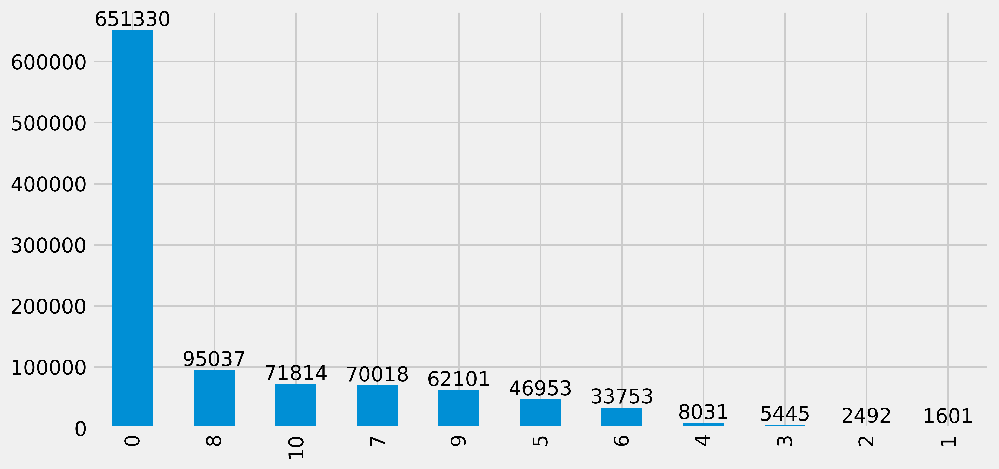

In [152]:
barplot_ratings = df["Book-Rating"].value_counts().head(11).plot(kind = 'bar')

for i in barplot_ratings.containers:
    barplot_ratings.bar_label(i)

In [153]:
#importing books data set
df_books = pd.read_csv("Downloads\Book.csv")
df_books

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [154]:
df_books.describe()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
count,271360,271360,271359,271360,271358,271360,271360,271357
unique,271360,242131,102023,202,16806,271044,271044,271041
top,195153448,Selected Poems,Agatha Christie,2002,Harlequin,http://images.amazon.com/images/P/185326119X.0...,http://images.amazon.com/images/P/185326119X.0...,http://images.amazon.com/images/P/225307649X.0...
freq,1,27,632,13903,7535,2,2,2


In [155]:
df_books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [156]:
df_books.duplicated().sum()

0

In [157]:
df_books.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [158]:
df_books["Book-Title"].nunique()

242131

In [159]:
df_books["Book-Author"].nunique()

102023

# VISUALIZATION¶

In [160]:
#Top 10 most popular books
pd.DataFrame(df_books["Book-Title"].value_counts().head(10))

,Book-Title
Selected Poems,27
Little Women,24
Wuthering Heights,21
Dracula,20
Adventures of Huckleberry Finn,20
The Secret Garden,20
Jane Eyre,19
Pride and Prejudice,18
The Night Before Christmas,18
Great Expectations,17


Text(0.5, 1.0, 'TOP 10 Most Popular Books')

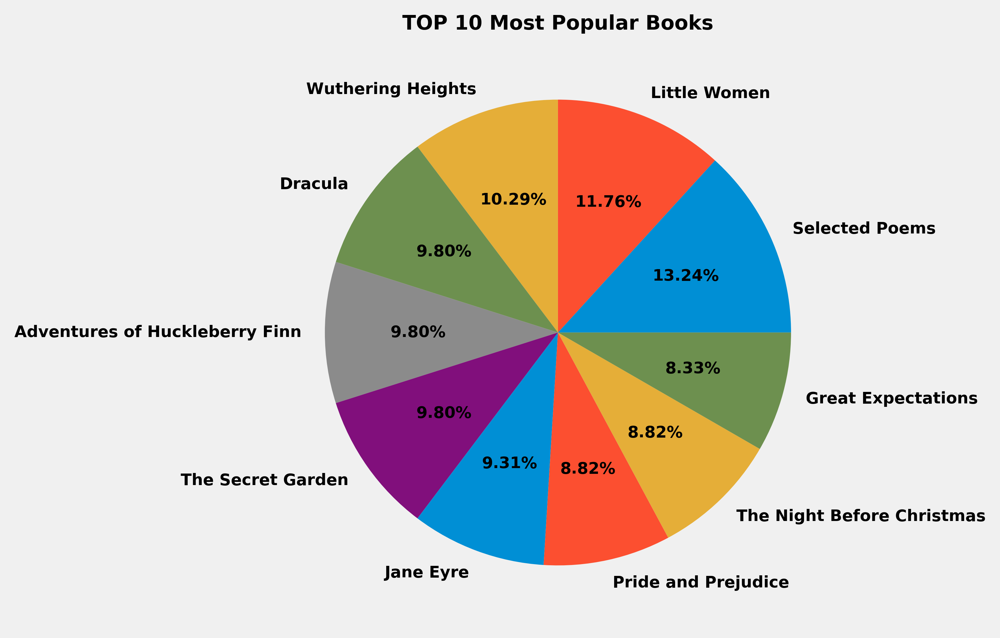

In [161]:
#pie chart for top 10 most popular books
plt.pie(df_books["Book-Title"].value_counts().head(10),
        labels=df_books["Book-Title"].value_counts().head(10).index,
        autopct= '%.2f%%',
        textprops = {'size' : 8, 'fontweight': 'bold'})

plt.title("TOP 10 Most Popular Books", fontsize = 10, fontweight = "bold")

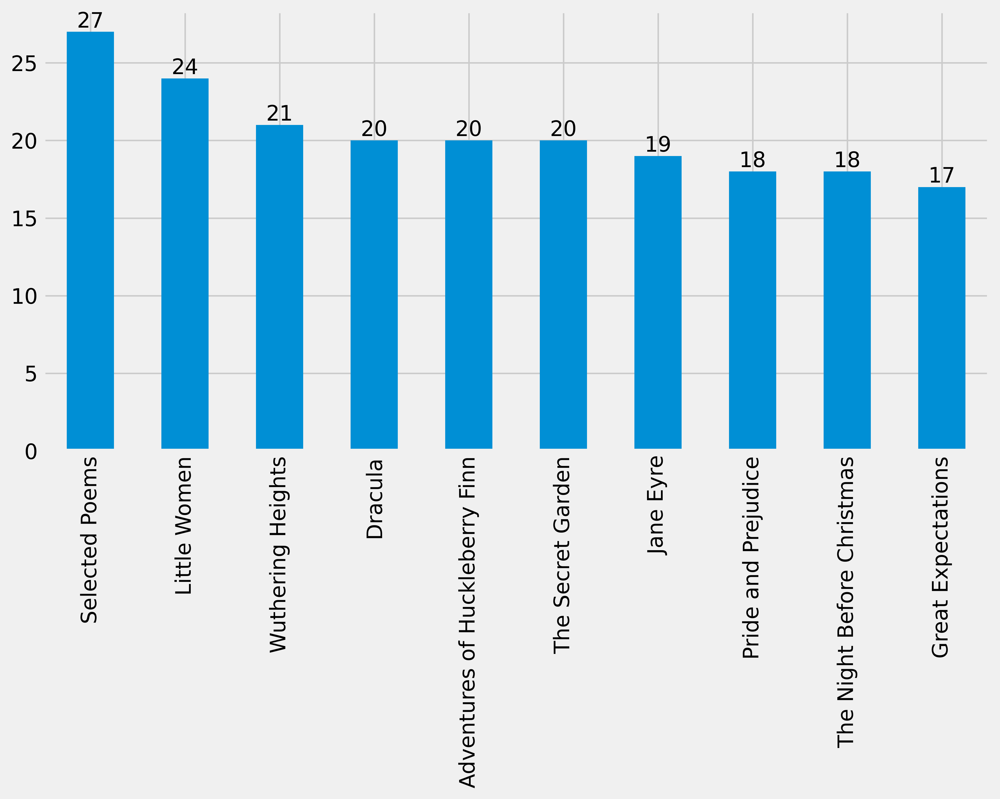

In [162]:
barplot = df_books["Book-Title"].value_counts().head(10).plot(kind = 'bar')

for i in barplot.containers:
    barplot.bar_label(i)

In [163]:
#Top 10 most popular authors
pd.DataFrame(df_books["Book-Author"].value_counts().head(10))

,Book-Author
Agatha Christie,632
William Shakespeare,567
Stephen King,524
Ann M. Martin,423
Carolyn Keene,373
Francine Pascal,372
Isaac Asimov,330
Nora Roberts,315
Barbara Cartland,307
Charles Dickens,302


Text(0.5, 1.0, 'TOP 10 Most Popular Books')

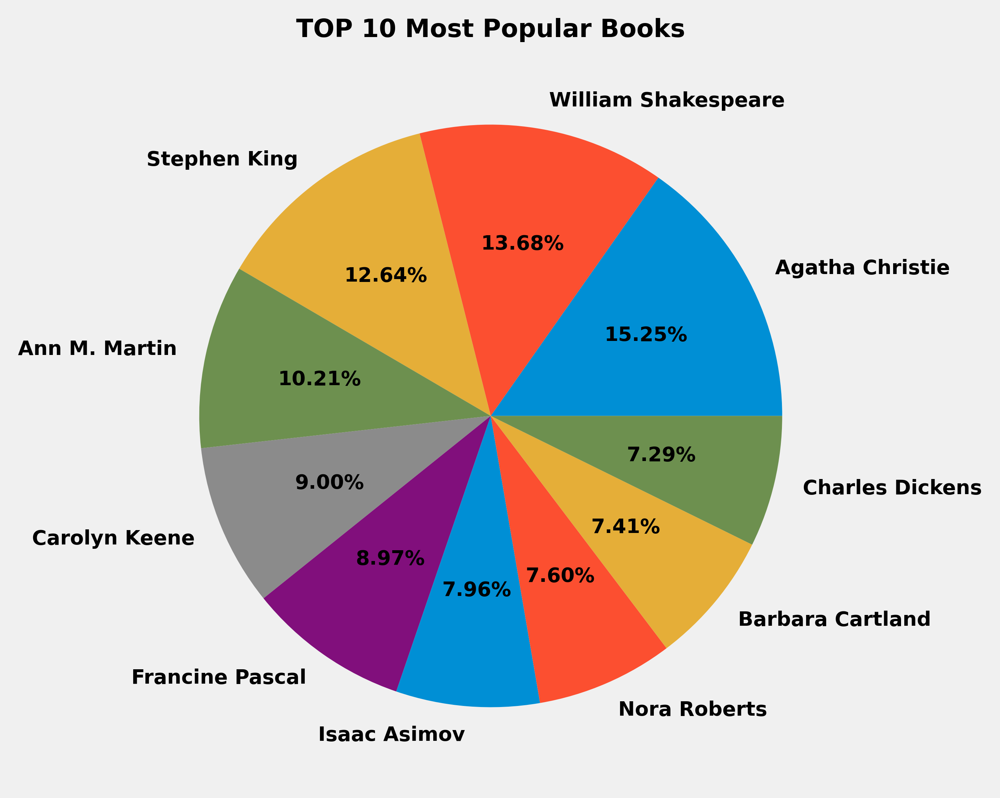

In [164]:
#pie chart for top 10 most popular authors
plt.pie(df_books["Book-Author"].value_counts().head(10),
        labels=df_books["Book-Author"].value_counts().head(10).index,
        autopct= '%.2f%%',
        textprops = {'size' : 8, 'fontweight': 'bold'})

plt.title("TOP 10 Most Popular Books", fontsize = 10, fontweight = "bold")

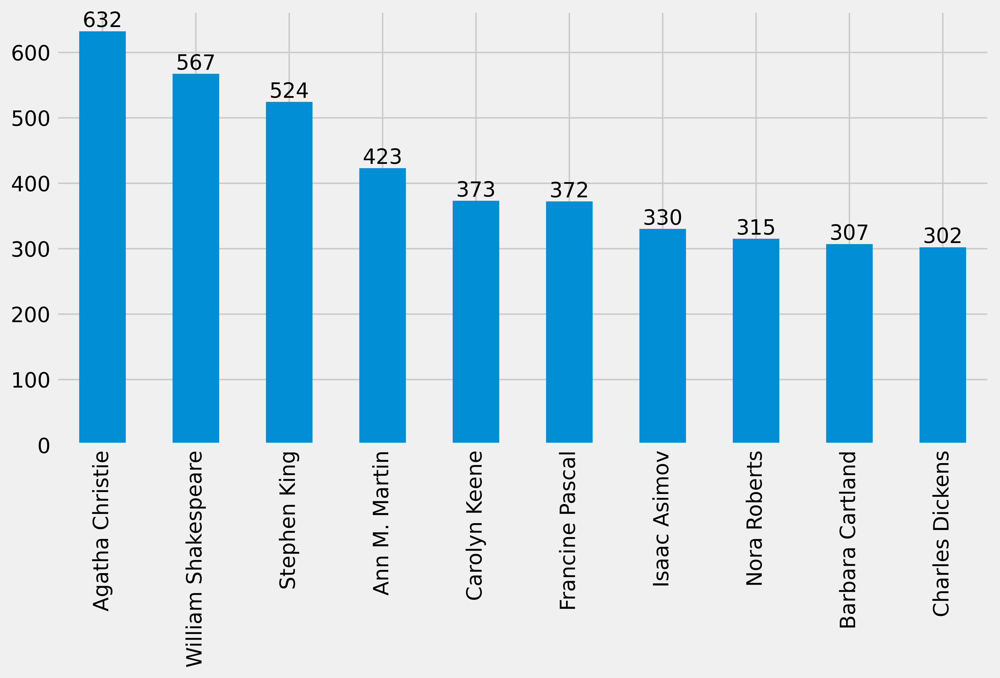

In [165]:
barplot_books = df_books["Book-Author"].value_counts().head(10).plot(kind = 'bar')

for i in barplot_books.containers:
    barplot_books.bar_label(i)

In [166]:
#importing users data set
df_users = pd.read_csv(r"Downloads\Users.csv")
df_users

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN
...,...,...,...
278853,278854,"portland, oregon, usa",NaN
278854,278855,"tacoma, washington, united kingdom",50.0
278855,278856,"brampton, ontario, canada",NaN
278856,278857,"knoxville, tennessee, usa",NaN


In [167]:
df_users.describe()

,User-ID,Age
count,278858.00000,168096.000000
mean,139429.50000,34.751434
std,80499.51502,14.428097
min,1.00000,0.000000
25%,69715.25000,24.000000
50%,139429.50000,32.000000
75%,209143.75000,44.000000
max,278858.00000,244.000000


In [168]:
df_users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [169]:
df_users.duplicated().sum()

0

In [170]:
df_users.isna().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [171]:
df_users.isna().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [172]:
df_users["Age"].mean()

34.75143370454978

In [173]:
df_users["Age"].median()

32.0

In [174]:
df_users["Age"].fillna(df_users["Age"].median(), inplace=True)

In [175]:
df_users.isna().sum()

User-ID     0
Location    0
Age         0
dtype: int64

In [176]:
df_users["Age"].nunique()

165

In [177]:
df_users["User-ID"].nunique()

278858

In [178]:
df_users["Age"].unique()

array([ 32.,  18.,  17.,  61.,  26.,  14.,  25.,  19.,  46.,  55.,  24.,
        20.,  34.,  23.,  51.,  31.,  21.,  44.,  30.,  57.,  43.,  37.,
        41.,  54.,  42.,  50.,  39.,  53.,  47.,  36.,  28.,  35.,  13.,
        58.,  49.,  38.,  45.,  62.,  63.,  27.,  33.,  29.,  66.,  40.,
        15.,  60.,   0.,  79.,  22.,  16.,  65.,  59.,  48.,  72.,  56.,
        67.,   1.,  80.,  52.,  69.,  71.,  73.,  78.,   9.,  64., 103.,
       104.,  12.,  74.,  75., 231.,   3.,  76.,  83.,  68., 119.,  11.,
        77.,   2.,  70.,  93.,   8.,   7.,   4.,  81., 114., 230., 239.,
        10.,   5., 148., 151.,   6., 101., 201.,  96.,  84.,  82.,  90.,
       123., 244., 133.,  91., 128.,  94.,  85., 141., 110.,  97., 219.,
        86., 124.,  92., 175., 172., 209., 212., 237.,  87., 162., 100.,
       156., 136.,  95.,  89., 106.,  99., 108., 210.,  88., 199., 147.,
       168., 132., 159., 186., 152., 102., 116., 200., 115., 226., 137.,
       207., 229., 138., 109., 105., 228., 183., 20

{'whiskers': [<matplotlib.lines.Line2D at 0x1b63072cd00>,
 'caps': [<matplotlib.lines.Line2D at 0x1b63072d240>,
 'boxes': [<matplotlib.lines.Line2D at 0x1b63072ca60>],
 'medians': [<matplotlib.lines.Line2D at 0x1b63072d780>],
 'fliers': [<matplotlib.lines.Line2D at 0x1b63072da20>],
 'means': []}

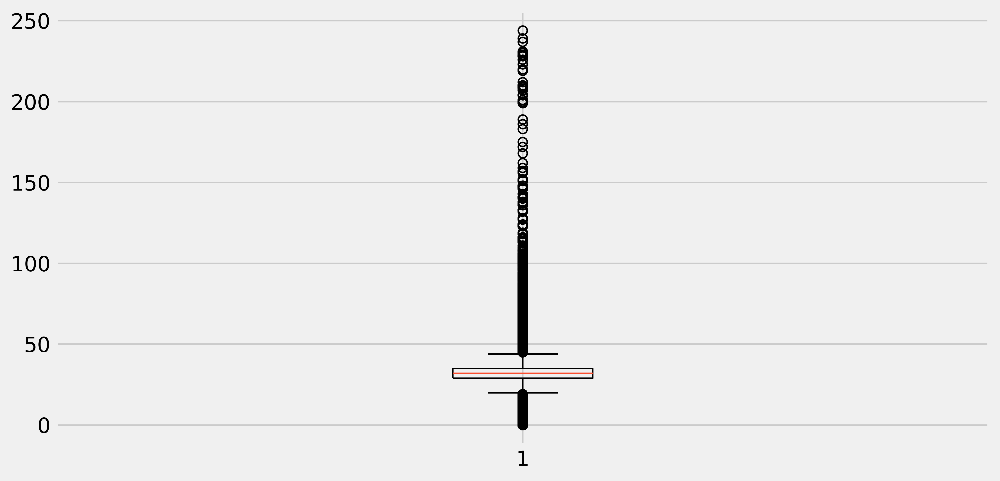

In [179]:
plt.boxplot(df_users["Age"])

There are many outliers in age columnn

In [180]:
def outlier(data,colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)

    iqr = q3 - q1

    upper = q3 + (1.5*iqr)
    lower = q1 - (1.5*iqr)

    return upper, lower

In [181]:
outlier(data= df_users, colname= "Age")

(44.0, 20.0)

In [182]:
df_users.loc[df_users["Age"] > 44, "Age"] = 44

In [183]:
df_users.loc[df_users["Age"] < 20, "Age"] = 20

In [184]:
df_users["Age"].unique()

array([32., 20., 44., 26., 25., 24., 34., 23., 31., 21., 30., 43., 37.,
       41., 42., 39., 36., 28., 35., 38., 27., 33., 29., 40., 22.])

<Axes: >

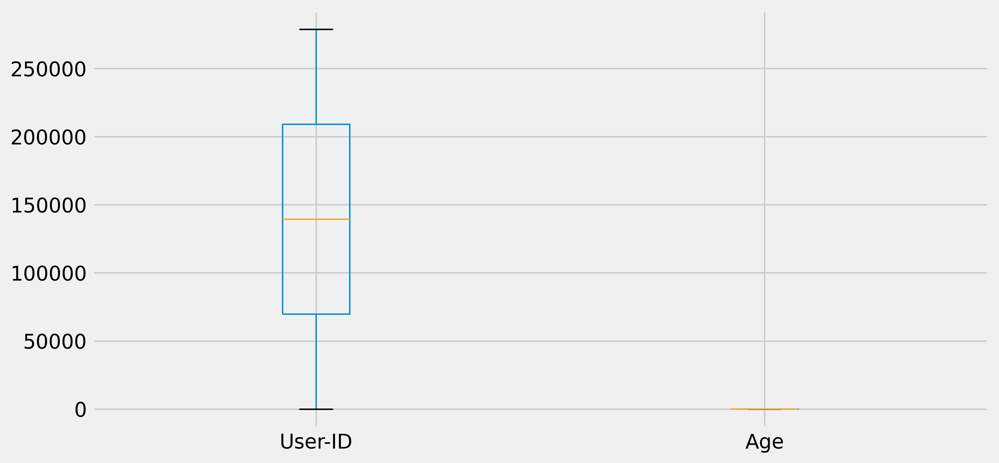

In [185]:
df_users.boxplot()

Text(0.5, 1.0, 'Different Age groups')

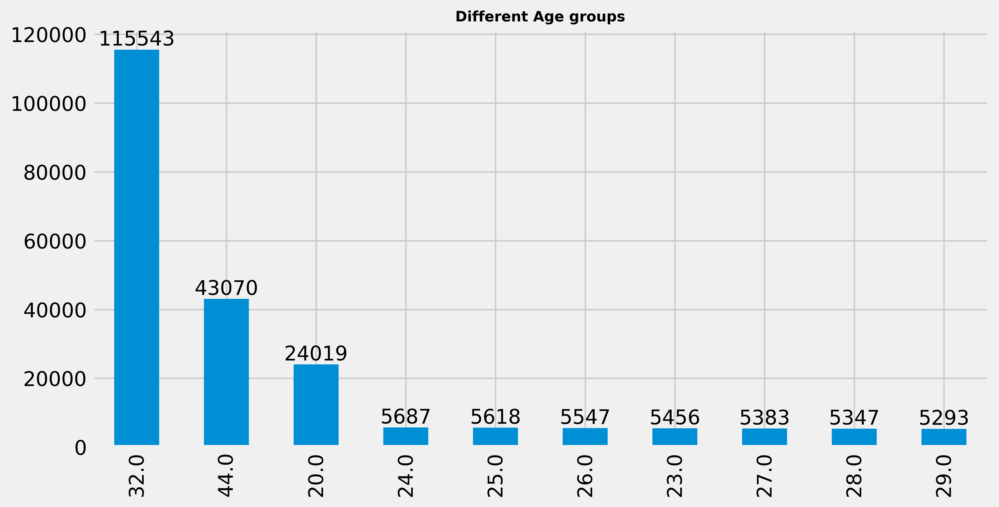

In [186]:
barplot_user = df_users["Age"].value_counts().head(10).plot(kind = 'bar')

for i in barplot_user.containers:
    barplot_user.bar_label(i)

plt.title("Different Age groups", fontsize = 10, fontweight = "bold")

Text(0.5, 1.0, 'Different Age groups')

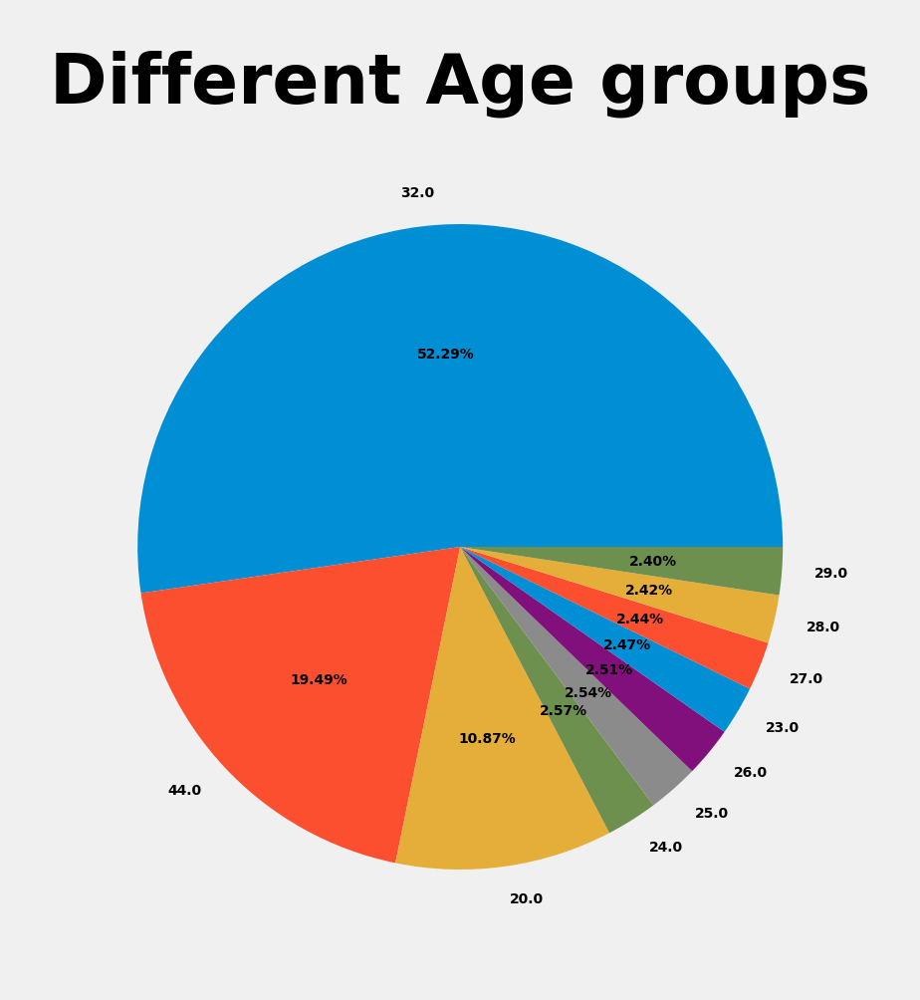

In [187]:
plt.figure(figsize=(5,2))
plt.pie(df_users["Age"].value_counts().head(10),
        labels=df_users["Age"].value_counts().head(10).index,
        autopct= '%.2f%%',
        textprops = {'size' : 2, 'fontweight': 'bold'})

plt.title("Different Age groups", fontsize = 10, fontweight = "bold")

Text(0, 0.5, 'Count')

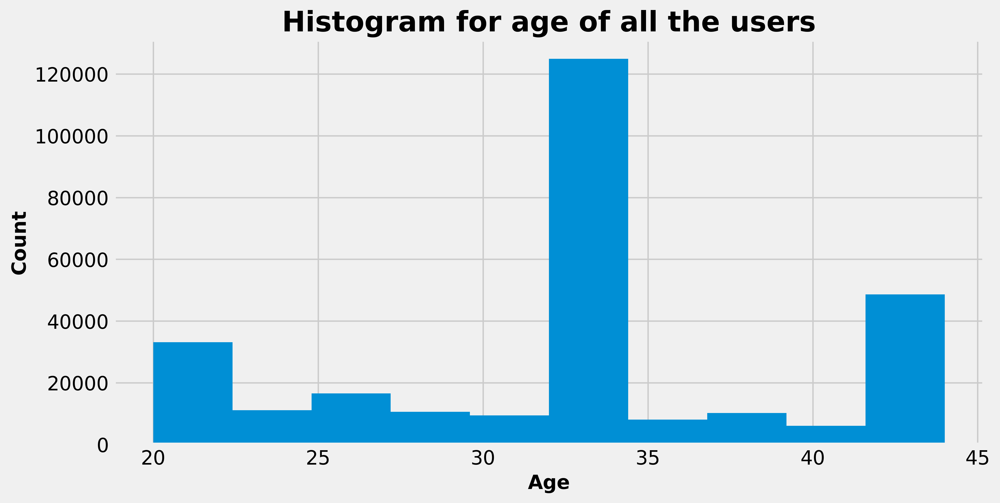

In [188]:
plt.hist(df_users["Age"])
plt.title("Histogram for age of all the users", fontweight = "bold")
plt.xlabel("Age", fontweight = "bold")
plt.ylabel("Count", fontweight = "bold")

The ratings are very unevenly distributed, and the vast majority of ratings are 0 .As quoted in the description of the dataset - BX-Book-Ratings contains the book rating information. Ratings are either explicit, expressed on a scale from 1-10 higher values denoting higher appreciation, or implicit, expressed by 0.Hence segragating implicit and explict ratings datasets

In [189]:
#Hence segragating implicit and explict ratings datasets
ratings_explicit = df[df['Book-Rating'] != 0]
ratings_implicit = df[df['Book-Rating'] == 0]

In [190]:
print('ratings_explicit dataset',ratings_explicit.shape)
print('ratings_implicit dataset',ratings_implicit.shape)

ratings_explicit dataset (397245, 3)
ratings_implicit dataset (651330, 3)


<Axes: xlabel='Book-Rating', ylabel='count'>

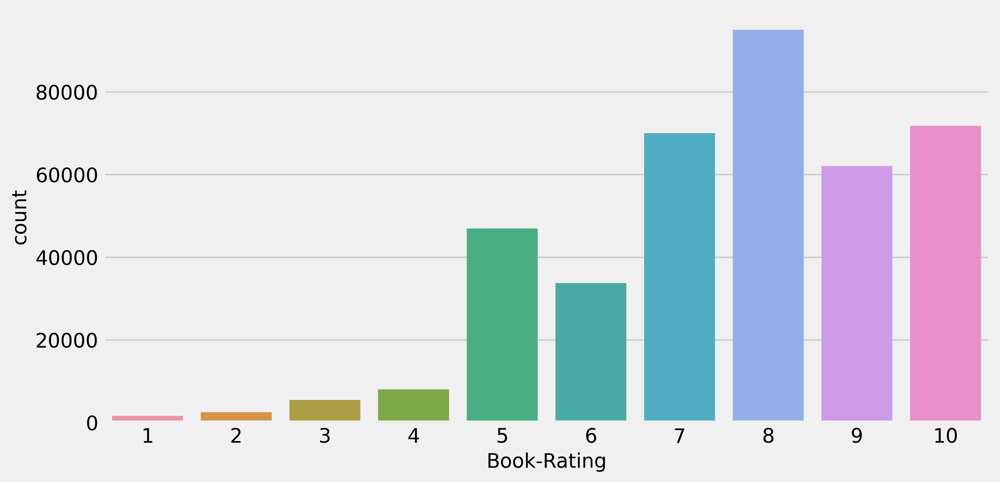

In [191]:
sns.countplot(x = ratings_explicit["Book-Rating"])

In [192]:
#Top 5 books which are rated by most number of users.
rating_count = pd.DataFrame(ratings_explicit.groupby('ISBN')['Book-Rating'].count())
rating_count.sort_values('Book-Rating', ascending=False).head()

,Book-Rating
ISBN,
316666343,635
971880107,526
385504209,452
312195516,354
679781587,302


In [193]:
# Create column Rating average
ratings_explicit['Avg_Rating']=ratings_explicit.groupby('ISBN')['Book-Rating'].transform('mean')
# Create column Rating sum
ratings_explicit['Total_No_Of_Users_Rated']=ratings_explicit.groupby('ISBN')['Book-Rating'].transform('count')

In [194]:
import os
import pandas as pd
import numpy as np

In [195]:
os.getcwd()

'C:\\Users\\Alok kumar'

In [196]:
os.chdir('C:\\Users\\Alok kumar\\OneDrive\Desktop')

In [197]:
#import the raw dataset
books = pd.read_csv('book.csv')
users = pd.read_csv('users.csv')
ratings = pd.read_csv('rating.csv')

In [198]:
books.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,2005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,60973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [199]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [200]:
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,155061224,5
2,276727,446520802,0
3,276729,052165615X,3
4,276729,521795028,6


In [201]:
print(books.shape)
print(users.shape)
print(ratings.shape)

(271360, 8)
(278858, 3)
(1048575, 3)


In [202]:
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [203]:
users.isnull().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [204]:
ratings.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [205]:
ratings.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [206]:
users.duplicated().sum()

0

In [207]:
ratings.duplicated().sum()

72

# Popularity based recommendation system

In [208]:
ratings.merge(books,on='ISBN')

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
3,8680,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
4,10314,034545104X,9,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [209]:
ratings.merge(books,on='ISBN').shape

(941112, 10)

In [210]:
ratings_with_name = ratings.merge(books,on='ISBN')

In [211]:
ratings_with_name

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
3,8680,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
4,10314,034545104X,9,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [212]:
ratings_with_name.groupby('Book-Title').count()

,User-ID,ISBN,Book-Rating,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
Book-Title,,,,,,,,,
"A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)",4,4,4,4,4,4,4,4,4
Always Have Popsicles,1,1,1,1,1,1,1,1,1
Apple Magic (The Collector's series),1,1,1,1,1,1,1,1,1
Beyond IBM: Leadership Marketing and Finance for the 1990s,1,1,1,1,1,1,1,1,1
Clifford Visita El Hospital (Clifford El Gran Perro Colorado),1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...
Ã?Â?l- Connection.,1,1,1,1,1,1,1,1,1
Ã?Â?lpiraten.,2,2,2,2,2,2,2,2,2
Ã?Â?rger mit Produkt X. Roman.,4,4,4,4,4,4,4,4,4


In [213]:
num_rating_df = ratings_with_name.groupby('Book-Title').count()['Book-Rating'].reset_index()
num_rating_df.rename(columns = {'Book-Rating':'num_ratings'},inplace=True)
num_rating_df

,Book-Title,num_ratings
0,A Light in the Storm: The Civil War Diary of ...,4
1,Always Have Popsicles,1
2,Apple Magic (The Collector's series),1
3,Beyond IBM: Leadership Marketing and Finance ...,1
4,Clifford Visita El Hospital (Clifford El Gran...,1
...,...,...
230215,Ã?Â?l- Connection.,1
230216,Ã?Â?lpiraten.,2
230217,Ã?Â?rger mit Produkt X. Roman.,4
230218,Ã?Â?stlich der Berge.,2


In [214]:
avg_rating_df = ratings_with_name.groupby('Book-Title').mean()['Book-Rating'].reset_index()
avg_rating_df.rename(columns = {'Book-Rating':'avg_ratings'},inplace=True)
avg_rating_df

,Book-Title,avg_ratings
0,A Light in the Storm: The Civil War Diary of ...,2.25
1,Always Have Popsicles,0.00
2,Apple Magic (The Collector's series),0.00
3,Beyond IBM: Leadership Marketing and Finance ...,0.00
4,Clifford Visita El Hospital (Clifford El Gran...,0.00
...,...,...
230215,Ã?Â?l- Connection.,0.00
230216,Ã?Â?lpiraten.,0.00
230217,Ã?Â?rger mit Produkt X. Roman.,5.25
230218,Ã?Â?stlich der Berge.,4.00


In [215]:
popular_df= num_rating_df.merge(avg_rating_df,on='Book-Title')
popular_df

,Book-Title,num_ratings,avg_ratings
0,A Light in the Storm: The Civil War Diary of ...,4,2.25
1,Always Have Popsicles,1,0.00
2,Apple Magic (The Collector's series),1,0.00
3,Beyond IBM: Leadership Marketing and Finance ...,1,0.00
4,Clifford Visita El Hospital (Clifford El Gran...,1,0.00
...,...,...,...
230215,Ã?Â?l- Connection.,1,0.00
230216,Ã?Â?lpiraten.,2,0.00
230217,Ã?Â?rger mit Produkt X. Roman.,4,5.25
230218,Ã?Â?stlich der Berge.,2,4.00


In [216]:
popular_df = popular_df[popular_df['num_ratings']>=250].sort_values('avg_ratings',ascending=False).head(50)


In [217]:
popular_df = popular_df.merge(books,on='Book-Title').drop_duplicates('Book-Title')[['Book-Title','Book-Author','Image-URL-M','num_ratings','avg_ratings']]

In [218]:
popular_df

,Book-Title,Book-Author,Image-URL-M,num_ratings,avg_ratings
0,Harry Potter and the Goblet of Fire (Book 4),J. K. Rowling,http://images.amazon.com/images/P/0439139597.0...,346,5.945087
2,Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,http://images.amazon.com/images/P/0439136350.0...,380,5.884211
5,Harry Potter and the Order of the Phoenix (Boo...,J. K. Rowling,http://images.amazon.com/images/P/043935806X.0...,316,5.544304
9,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,http://images.amazon.com/images/P/0439064872.0...,501,5.177645
12,The Hobbit : The Enchanting Prelude to The Lor...,J.R.R. TOLKIEN,http://images.amazon.com/images/P/0345339681.0...,261,4.969349
13,Harry Potter and the Sorcerer's Stone (Harry P...,J. K. Rowling,http://images.amazon.com/images/P/059035342X.0...,519,4.938343
15,The Fellowship of the Ring (The Lord of the Ri...,J.R.R. TOLKIEN,http://images.amazon.com/images/P/0345339703.0...,340,4.885294
24,To Kill a Mockingbird,Harper Lee,http://images.amazon.com/images/P/0446310786.0...,463,4.684665
32,The Da Vinci Code,Dan Brown,http://images.amazon.com/images/P/0385504209.0...,828,4.679952
38,The Catcher in the Rye,J.D. Salinger,http://images.amazon.com/images/P/0316769487.0...,401,4.615960


# Collaborative Filtering Recommendation System

In [219]:
ratings_with_name

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
3,8680,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
4,10314,034545104X,9,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [220]:
x = ratings_with_name.groupby('User-ID').count()['Book-Rating']>200
padhe_likhe_users = x[x].index

In [221]:
ratings_with_name

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,276725,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
1,2313,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
3,8680,034545104X,5,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
4,10314,034545104X,9,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [222]:
ratings_with_name[ratings_with_name['User-ID'].isin(padhe_likhe_users)]

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
5,23768,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
7,28523,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
15,77940,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
16,81977,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [223]:
filtered_rating = ratings_with_name[ratings_with_name['User-ID'].isin(padhe_likhe_users)]

In [224]:
filtered_rating

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
2,6543,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
5,23768,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
7,28523,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
15,77940,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
16,81977,034545104X,0,Flesh Tones: A Novel,M. J. Rose,2002,Ballantine Books,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...,http://images.amazon.com/images/P/034545104X.0...
...,...,...,...,...,...,...,...,...,...,...
941107,250764,440106575,0,HIDDEN FIRES,JANETTE RADCLIFFE,1978,Dell,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...,http://images.amazon.com/images/P/0440106575.0...
941108,250764,451157516,0,"Cheyenne (Fortunes West, No 2)",A.R. Riefe,1988,New Amer Library (Mm),http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...,http://images.amazon.com/images/P/0451157516.0...
941109,250764,048623715X,0,Glamorous Movie Stars of the Thirties: Paper D...,Tom Tierney,1982,Dover Publications,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...,http://images.amazon.com/images/P/048623715X.0...
941110,250764,486256588,0,Schiaparelli Fashion Review: Paper Dolls in Fu...,Tom Tierney,1988,Dover Publications,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...,http://images.amazon.com/images/P/0486256588.0...


In [225]:
filtered_rating.groupby('Book-Title').count()['Book-Rating']

Book-Title
 A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)    2
 Always Have Popsicles                                                                                        1
 Apple Magic (The Collector's series)                                                                         1
 Beyond IBM: Leadership Marketing and Finance for the 1990s                                                   1
 Clifford Visita El Hospital (Clifford El Gran Perro Colorado)                                                1
                                                                                                             ..
Ã?ngeles fugaces (Falling Angels)                                                                             1
Ã?Â?ber das Fernsehen.                                                                                        2
Ã?Â?ber die Pflicht zum Ungehorsam gegen den Staat.                                          

In [226]:
y = filtered_rating.groupby('Book-Title').count()['Book-Rating']>=50
y[y]

Book-Title
1984                                                                 True
1st to Die: A Novel                                                  True
2nd Chance                                                           True
4 Blondes                                                            True
A Bend in the Road                                                   True
                                                                     ... 
Year of Wonders                                                      True
You Belong To Me                                                     True
Zen and the Art of Motorcycle Maintenance: An Inquiry into Values    True
Zoya                                                                 True
\O\" Is for Outlaw"                                                  True
Name: Book-Rating, Length: 603, dtype: bool

In [227]:
y = filtered_rating.groupby('Book-Title').count()['Book-Rating']>=50
famous_books = y[y].index

In [228]:
famous_books

Index(['1984', '1st to Die: A Novel', '2nd Chance', '4 Blondes',
       'A Bend in the Road', 'A Case of Need',
       'A Child Called \It\": One Child's Courage to Survive"',
       'A Civil Action', 'A Day Late and a Dollar Short', 'A Fine Balance',
       ...
       'Winter Moon', 'Winter Solstice', 'Wish You Well', 'Without Remorse',
       'Wuthering Heights', 'Year of Wonders', 'You Belong To Me',
       'Zen and the Art of Motorcycle Maintenance: An Inquiry into Values',
       'Zoya', '\O\" Is for Outlaw"'],
      dtype='object', name='Book-Title', length=603)

In [229]:
filtered_rating[filtered_rating['Book-Title'].isin(famous_books)]

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
56,278418,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
58,3363,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
59,7158,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
62,11676,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
67,23768,446520802,6,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
...,...,...,...,...,...,...,...,...,...,...
937464,245963,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
937465,246671,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
938778,247429,073940086X,0,Mirror Image,Danielle Steel,0,Delacorte Press,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...
939428,248718,031202164X,8,Ashes to Ashes,Mary Monica Pulver,1988,Horizon Book Promotions,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...


In [230]:
final_ratings = filtered_rating[filtered_rating['Book-Title'].isin(famous_books)]

In [231]:
final_ratings

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
56,278418,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
58,3363,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
59,7158,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
62,11676,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
67,23768,446520802,6,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
...,...,...,...,...,...,...,...,...,...,...
937464,245963,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
937465,246671,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
938778,247429,073940086X,0,Mirror Image,Danielle Steel,0,Delacorte Press,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...
939428,248718,031202164X,8,Ashes to Ashes,Mary Monica Pulver,1988,Horizon Book Promotions,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...


In [232]:
final_ratings.drop_duplicates()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
56,278418,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
58,3363,446520802,0,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
59,7158,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
62,11676,446520802,10,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
67,23768,446520802,6,The Notebook,Nicholas Sparks,1996,Warner Books,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...,http://images.amazon.com/images/P/0446520802.0...
...,...,...,...,...,...,...,...,...,...,...
937464,245963,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
937465,246671,380781506,0,Remember Me,Danice Allen,1996,Harper Mass Market Paperbacks (Mm),http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...,http://images.amazon.com/images/P/0380781506.0...
938778,247429,073940086X,0,Mirror Image,Danielle Steel,0,Delacorte Press,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...,http://images.amazon.com/images/P/073940086X.0...
939428,248718,031202164X,8,Ashes to Ashes,Mary Monica Pulver,1988,Horizon Book Promotions,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...,http://images.amazon.com/images/P/031202164X.0...


In [233]:
final_ratings.pivot_table(index='Book-Title',columns='User-ID',values='Book-Rating')

User-ID,254,2276,2766,2977,3363,4017,4385,6251,6323,6543,6563,6575,7158,7286,7346,7915,8067,8245,8681,8936,10447,10819,11601,11676,11993,12538,12824,12982,13082,13273,13552,13850,14422,14521,15408,15418,16106,16634,16795,16916,16966,17950,18067,18401,19085,19664,20115,20201,21014,21252,21576,21659,22625,23288,23768,23872,23902,24194,24921,25409,25601,25981,26516,26535,26544,26583,26593,27617,28204,28360,28523,28591,29259,29855,30276,30487,30511,30533,30711,30735,30972,31315,31391,31556,31826,31846,32195,32440,32721,32773,33974,35050,35836,35857,35859,36606,36609,36836,36907,37567,37712,37950,38023,38273,38781,39281,39467,39616,39646,39773,40889,40943,41084,41841,42914,43246,43806,43842,44595,44728,46398,47316,48494,49109,49460,49889,50225,51094,51350,51386,51450,51883,52199,52584,52614,52853,52917,53174,53628,53729,54218,55187,55490,55492,55548,55734,55892,56271,56399,56447,56856,56959,59172,59971,60244,60277,60337,60707,61619,62272,62891,62895,63394,63714,63938,64436,65258,66680,67840,68555,69042,69078,69232,69355,69405,69697,69808,69971,70052,70415,70594,71712,72352,72992,73394,73651,75591,75860,76151,76223,76352,76499,76626,76818,76942,77809,77940,78553,78783,78834,78973,79186,79441,80538,80683,81045,81492,81560,81977,82407,82831,82893,82926,83637,84024,85426,85526,85656,85701,85757,85993,86202,86243,86641,87141,87143,87555,87746,87974,88283,88677,88693,88733,88937,89602,91203,91342,91832,91931,92547,92652,92810,92979,93047,93085,93363,93629,94242,94347,94853,94923,95193,95316,95359,95903,95932,95991,96054,96448,97874,98391,98741,98758,100459,100644,100846,100906,101209,101851,101876,102275,102647,102702,102967,104399,104429,104636,104665,105374,105517,105979,106225,106816,107021,107301,107453,107784,107951,108005,108285,108352,109461,109574,109955,110029,110483,110912,110934,110973,111174,111947,112001,112026,112881,113270,113519,113817,113904,113983,114178,114368,114414,114444,114868,114988,115002,115003,115120,115490,116599,117251,117539,119575,120093,120548,122429,122793,122881,123790,123883,123981,124078,124079,124363,124487,124942,125039,125519,125692,125774,126492,126604,126736,127200,127233,127359,127429,127914,128696,128835,129008,129074,129358,129465,129716,129851,130474,130554,130571,131027,131046,131402,131837,131855,132083,133571,133689,133747,135045,135149,135265,135458,135831,136010,136139,136205,136252,136382,137589,137688,138097,138441,138578,138844,139467,139742,140000,140036,140358,141493,141710,142093,142524,143175,143253,143415,143792,144531,144555,145449,145451,145619,145641,146113,146230,146348,147141,147451,147847,147965,148199,148258,148744,149069,149907,149908,149934,150124,150498,150968,150979,151790,151806,152186,152249,153563,153662,153718,154992,155014,155147,155219,155495,156150,156269,156467,157273,157811,158295,159033,159376,159858,160032,160819,161752,162052,162639,162738,163804,163973,164027,164323,164465,164533,164675,164828,165232,165308,165319,166123,166596,167349,167471,167800,168047,168064,168144,168245,169233,169663,169699,170229,170513,170518,170575,170634,170742,170947,171118,172030,172512,172742,173291,173415,173632,173684,173835,174216,174304,174791,175003,175886,177072,177090,177374,177432,177458,177690,178181,178199,178667,178950,179733,179744,179772,179978,180348,180586,180651,180917,180957,181176,181687,182085,182086,182987,182993,183196,183995,184299,185233,185384,186570,187145,187256,187517,188010,189334,189516,189835,189973,190459,190708,190807,190925,191187,192093,193499,193560,194600,194669,195694,196047,196077,196160,196457,196502,197364,197659,197775,198621,198699,198711,199416,199772,200226,200674,201017,201290,201447,201526,201674,201768,201783,203240,203799,203968,204167,204522,204591,204864,205473,205735,205980,206074,206534,206567,206979,207246,207349,207499,207782,208141,208147,208406,208410,208568,208671,208829,209373,209516,209756,209875,210035,210485,210792,210959,211426,211430,211847,211919,212645,212898,212923,212965,213150,213350,214272,214786,216012,216444

In [234]:
pt = final_ratings.pivot_table(index='Book-Title',columns='User-ID',values='Book-Rating')

In [235]:
pt.fillna(0,inplace=True)

In [236]:
pt

User-ID,254,2276,2766,2977,3363,4017,4385,6251,6323,6543,6563,6575,7158,7286,7346,7915,8067,8245,8681,8936,10447,10819,11601,11676,11993,12538,12824,12982,13082,13273,13552,13850,14422,14521,15408,15418,16106,16634,16795,16916,16966,17950,18067,18401,19085,19664,20115,20201,21014,21252,21576,21659,22625,23288,23768,23872,23902,24194,24921,25409,25601,25981,26516,26535,26544,26583,26593,27617,28204,28360,28523,28591,29259,29855,30276,30487,30511,30533,30711,30735,30972,31315,31391,31556,31826,31846,32195,32440,32721,32773,33974,35050,35836,35857,35859,36606,36609,36836,36907,37567,37712,37950,38023,38273,38781,39281,39467,39616,39646,39773,40889,40943,41084,41841,42914,43246,43806,43842,44595,44728,46398,47316,48494,49109,49460,49889,50225,51094,51350,51386,51450,51883,52199,52584,52614,52853,52917,53174,53628,53729,54218,55187,55490,55492,55548,55734,55892,56271,56399,56447,56856,56959,59172,59971,60244,60277,60337,60707,61619,62272,62891,62895,63394,63714,63938,64436,65258,66680,67840,68555,69042,69078,69232,69355,69405,69697,69808,69971,70052,70415,70594,71712,72352,72992,73394,73651,75591,75860,76151,76223,76352,76499,76626,76818,76942,77809,77940,78553,78783,78834,78973,79186,79441,80538,80683,81045,81492,81560,81977,82407,82831,82893,82926,83637,84024,85426,85526,85656,85701,85757,85993,86202,86243,86641,87141,87143,87555,87746,87974,88283,88677,88693,88733,88937,89602,91203,91342,91832,91931,92547,92652,92810,92979,93047,93085,93363,93629,94242,94347,94853,94923,95193,95316,95359,95903,95932,95991,96054,96448,97874,98391,98741,98758,100459,100644,100846,100906,101209,101851,101876,102275,102647,102702,102967,104399,104429,104636,104665,105374,105517,105979,106225,106816,107021,107301,107453,107784,107951,108005,108285,108352,109461,109574,109955,110029,110483,110912,110934,110973,111174,111947,112001,112026,112881,113270,113519,113817,113904,113983,114178,114368,114414,114444,114868,114988,115002,115003,115120,115490,116599,117251,117539,119575,120093,120548,122429,122793,122881,123790,123883,123981,124078,124079,124363,124487,124942,125039,125519,125692,125774,126492,126604,126736,127200,127233,127359,127429,127914,128696,128835,129008,129074,129358,129465,129716,129851,130474,130554,130571,131027,131046,131402,131837,131855,132083,133571,133689,133747,135045,135149,135265,135458,135831,136010,136139,136205,136252,136382,137589,137688,138097,138441,138578,138844,139467,139742,140000,140036,140358,141493,141710,142093,142524,143175,143253,143415,143792,144531,144555,145449,145451,145619,145641,146113,146230,146348,147141,147451,147847,147965,148199,148258,148744,149069,149907,149908,149934,150124,150498,150968,150979,151790,151806,152186,152249,153563,153662,153718,154992,155014,155147,155219,155495,156150,156269,156467,157273,157811,158295,159033,159376,159858,160032,160819,161752,162052,162639,162738,163804,163973,164027,164323,164465,164533,164675,164828,165232,165308,165319,166123,166596,167349,167471,167800,168047,168064,168144,168245,169233,169663,169699,170229,170513,170518,170575,170634,170742,170947,171118,172030,172512,172742,173291,173415,173632,173684,173835,174216,174304,174791,175003,175886,177072,177090,177374,177432,177458,177690,178181,178199,178667,178950,179733,179744,179772,179978,180348,180586,180651,180917,180957,181176,181687,182085,182086,182987,182993,183196,183995,184299,185233,185384,186570,187145,187256,187517,188010,189334,189516,189835,189973,190459,190708,190807,190925,191187,192093,193499,193560,194600,194669,195694,196047,196077,196160,196457,196502,197364,197659,197775,198621,198699,198711,199416,199772,200226,200674,201017,201290,201447,201526,201674,201768,201783,203240,203799,203968,204167,204522,204591,204864,205473,205735,205980,206074,206534,206567,206979,207246,207349,207499,207782,208141,208147,208406,208410,208568,208671,208829,209373,209516,209756,209875,210035,210485,210792,210959,211426,211430,211847,211919,212645,212898,212923,212965,213150,213350,214272,214786,216012,216444

# Analyzing The Data

In [237]:
from sklearn.metrics.pairwise import cosine_similarity

In [238]:
cosine_similarity(pt).shape

(603, 603)

In [239]:
similarity_score=cosine_similarity(pt)

In [240]:
similarity_score.shape

(603, 603)

In [241]:
def recommend(book_name):
    #fetch index
    return suggestions

In [242]:
#index calculating
np.where(pt.index=='Zoya')[0][0]

601

In [243]:
def recommend(book_name):
    #fetch index
    index = np.where(pt.index=='Zoya')[0][0]
    distances = similarity_score[index]
    return suggestions

In [244]:
similarity_score[0]

array([1.        , 0.11013674, 0.0127091 , 0.        , 0.05618727,
       0.03068486, 0.0874928 , 0.15837741, 0.03352553, 0.03769765,
       0.07734131, 0.02289102, 0.10711257, 0.08534426, 0.11769018,
       0.0557728 , 0.02587927, 0.12651909, 0.        , 0.14733114,
       0.08388437, 0.07732577, 0.09389112, 0.        , 0.07642162,
       0.14517437, 0.12847808, 0.01638712, 0.09117911, 0.05011953,
       0.01653141, 0.10104308, 0.01975371, 0.0268319 , 0.0885619 ,
       0.12161054, 0.06009405, 0.08965023, 0.01517732, 0.09520085,
       0.05637857, 0.27779439, 0.10570014, 0.01038525, 0.09208417,
       0.        , 0.04592574, 0.02005129, 0.        , 0.06136685,
       0.00604602, 0.08465384, 0.05775924, 0.1985691 , 0.        ,
       0.01346916, 0.03154015, 0.04679173, 0.08915014, 0.        ,
       0.13920242, 0.06799777, 0.        , 0.11604696, 0.03040797,
       0.05247255, 0.07067691, 0.12127148, 0.03442769, 0.01540805,
       0.2660586 , 0.        , 0.10733528, 0.09150259, 0.03182

In [245]:
 #we will use enumerate to get the distance and index of the book
list(enumerate(similarity_score[0]))

[(0, 0.9999999999999999),
 (1, 0.11013673786603234),
 (2, 0.012709096162552554),
 (3, 0.0),
 (4, 0.056187265920105686),
 (5, 0.03068485749629836),
 (6, 0.08749280065853147),
 (7, 0.1583774079616529),
 (8, 0.03352552884975706),
 (9, 0.03769765273802705),
 (10, 0.0773413106999475),
 (11, 0.022891021724373645),
 (12, 0.10711256611041288),
 (13, 0.0853442608068008),
 (14, 0.11769017858109744),
 (15, 0.05577280480963012),
 (16, 0.025879265058930883),
 (17, 0.12651909167420355),
 (18, 0.0),
 (19, 0.14733114497174032),
 (20, 0.08388437205827272),
 (21, 0.07732576537726599),
 (22, 0.09389112473359282),
 (23, 0.0),
 (24, 0.07642161641669529),
 (25, 0.14517436987314897),
 (26, 0.1284780765846753),
 (27, 0.016387121412359953),
 (28, 0.09117911114111121),
 (29, 0.050119528725302204),
 (30, 0.01653140633552414),
 (31, 0.10104308272842213),
 (32, 0.019753714961270933),
 (33, 0.026831896417895157),
 (34, 0.08856189996411325),
 (35, 0.12161053631766668),
 (36, 0.060094054659944524),
 (37, 0.0896502336

In [246]:
#sorting to get the most similar book
sorted(list(enumerate(similarity_score[0])),key=lambda x:x[1], reverse=True)[1:6]

[(41, 0.27779439320159416),
 (70, 0.2660586000369668),
 (541, 0.2506295364129756),
 (459, 0.23786512783485836),
 (147, 0.234784541598818)]

In [247]:
def recommend(book_name):
    #fetch index
    index = np.where(pt.index==book_name)[0][0]
    similar_items = sorted(list(enumerate(similarity_score[index])),key=lambda x:x[1], reverse=True)[1:11]
    for i in similar_items:
        print(pt.index[i[0]])

In [248]:
recommend('Harry Potter and the Chamber of Secrets (Book 2)')

Harry Potter and the Prisoner of Azkaban (Book 3)
Harry Potter and the Goblet of Fire (Book 4)
Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback))
Harry Potter and the Sorcerer's Stone (Book 1)
Harry Potter and the Order of the Phoenix (Book 5)
The Fellowship of the Ring (The Lord of the Rings, Part 1)
The Witness
The Secret Garden
The Firm
A Time to Kill


In [249]:
pt.index[545]

'The Winner'

In [250]:
# For similar books recommendation
from numpy.lib.npyio import recfromtxt
def recommendations_for_user(user_id):
    print('\n Recommended Books for User_id',(user_id),':\n')
    recom = list(similarity.sort_values([user_id], ascending= False).head().index)
    books_list = []
    for i in recom:
        books_list = books_list + list(users_rated_50[users_rated_50['User-ID']==i]['Book-Title'])
    return set(books_list)-set(users_rated_50[users_rated_50['User-ID']==user_id]['Book-Title'])

In [2]:
pip install streamlit pandas scikit-surprise

Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install streamlit pandas scikit-surprise

Note: you may need to restart the kernel to use updated packages.


In [5]:
import streamlit as st
import pandas as pd
from surprise import SVD
from surprise import Dataset
from surprise import Reader
from surprise.model_selection import train_test_split
from surprise import accuracy

# Load the dataset
df = pd.read_csv(r"Downloads\final_ratings1.csv")

# Load the Surprise dataset
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(df[['User-ID', 'ISBN', 'Book-Rating']], reader)

# Train-test split
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Build the SVD model
model = SVD()
model.fit(trainset)

# Evaluate the model
predictions = model.test(testset)
rmse = accuracy.rmse(predictions)

# Streamlit App
st.title('Book Recommendation System')

# User input for Book ISBN
book_isbn = st.text_input('Enter a book ISBN to get recommendations:', '0316666343')

# Get recommendations for the entered book ISBN
if st.button('Get Recommendations'):
    try:
        # Get inner id for the entered book ISBN
        book_inner_id = model.trainset.to_inner_iid(book_isbn)

        # Get top N recommendations
        recommendations = model.get_neighbors(book_inner_id, k=5)

        # Convert inner ids back to ISBNs
        recommended_books = [model.trainset.to_raw_iid(inner_id) for inner_id in recommendations]

        # Display recommendations
        st.subheader('Top 5 Recommendations:')
        for i, book in enumerate(recommended_books):
            st.write(f"{i+1}. {df[df['ISBN'] == book]['Book-Title'].values[0]} by {df[df['ISBN'] == book]['Book-Author'].values[0]}")

    except ValueError:
        st.error('Invalid Book ISBN. Please enter a valid ISBN.')

# Display RMSE of the model
st.sidebar.subheader('Model Evaluation')
st.sidebar.text(f'RMSE: {rmse:.4f}')

# Optionally, you can display other information from the dataset in the main content or sidebar.
# Example: Display unique book titles in the sidebar
st.sidebar.subheader('Unique Book Titles')
unique_titles = df['Book-Title'].unique()
st.sidebar.write(unique_titles[:10])  # Displaying the first 10 unique titles as an example


RMSE: 1.5207


2024-01-19 23:53:37.685 
  command:

    streamlit run C:\Users\Alok kumar\anaconda3\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]
